In [58]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.datasets import make_classification
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.neighbors import KDTree
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, TfidfTransformer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from textblob.sentiments import NaiveBayesAnalyzer
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import plot_confusion_matrix
from sklearn import preprocessing
from sklearn import utils

#Web related
from bs4 import BeautifulSoup 
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize, RegexpTokenizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from textblob import TextBlob
import praw
from praw.models import MoreComments
import nltk  
import random  
import string
import urllib.request  
import re  
import json
from pprint import pprint
import http.client
import emoji
import requests
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import RegexpTokenizer
from nltk.probability import FreqDist
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.text import Text 

#plotting
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import cm
import plotly.express as px
from PIL import Image

#word maps
nltk.download('wordnet')
nltk.download('omw-1.4')

#To be used throughout
wordnet_lem = WordNetLemmatizer()
regexp = RegexpTokenizer('\w+')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\reigh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\reigh\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [2]:
def corpus_maker(element):
    in_text = ''
    for e in element:
        in_text += e.text
    corpus = nltk.sent_tokenize(in_text)
    return corpus   

In [3]:
#Cleaner for corpus objects

def web_cleaner(corpus):
    for i in range(len(corpus)):
        corpus[i] = corpus[i].lower()
        corpus[i] = re.sub(r'\W',' ', corpus [i])
        corpus[i] = re.sub(r'\s+',' ', corpus [i])
        corpus[i] = re.sub(r"^\s+", "", corpus [i])
        corpus[i] = re.sub('[^a-zA-Z]', ' ', corpus[i]) #punctuation
        corpus[i] = re.sub(' +', ' ', corpus[i])
        corpus[i] = re.sub('[^\w\s]',' ', corpus[i])
        corpus[i] = re.sub('[^-9A-Za-z ]',' ', corpus[i])
    return corpus

In [4]:
def sentiment_score(corpus): 
    feel_obj = SentimentIntensityAnalyzer() 
    sentiment_dict = feel_obj.polarity_scores(corpus) 
    print("Overall sentiment of dictionary: ", sentiment_dict) 
    
    print("Sentiment seems: ", sentiment_dict['neg']*100, "% Negative") 
    print("Sentiment seems: ", sentiment_dict['neu']*100, "% Neutral") 
    print("Sentiment seems: ", sentiment_dict['pos']*100, "% Positive") 
  
    print("Sentiment rating overall", end = " ")
    if sentiment_dict['pos'] >= 0.55 : 
        print("Positive") 
    
    elif sentiment_dict['neg'] >=  0.55 :
        print("Negative") 
    else :
        print("Neutral")
        return

# `Part Two`: Scraping Reddit data related to 'Jordan Peterson'
______________________________________________________________________________________________________
In part 2 we will be looking at Reddit posts related to Jordan Peterson, through 2 methods of extraction using the PRAW API agent provided by reddit.
______________________________________________________________________________________________________

In [5]:
user_agent = 'XXXXXXXXXXXXXXXXXXXXXXXXXX'


reddit = praw.Reddit(client_id ='XXXXXXXXXXXXXXXXXXXXXXXXXX',
                     client_secret ='XXXXXXXXXXXXXXXXXXXXXXXXXX',
                     password='XXXXXXXXXXXXXXXXXXXXXXXXXX',
                     user_agent ='XXXXXXXXXXXXXXXXXXXXXXXXXX')
 
# to verify whether the instance is authorized 
print(reddit.read_only)

True


In [6]:
#Starting with general subreddit for JP

subreddit_name = "JordanPeterson"
jor = reddit.subreddit(subreddit_name)

print(jor)

JordanPeterson


In [7]:
# Data Pulling
hot = jor.hot(limit= 1000) 
new = jor.new(limit= 1000) 
top = jor.top(limit= 1000) 

In [8]:
#Pulling all 'HOT' posts

dict_jor_hot = {"title":[], 
                "subreddit":[], 
                "score":[], 
                "id":[], 
                "url":[], 
                "comms_num":[], 
                "created":[], 
                "body":[],
                "created_utc":[],
                "upvote_ratio":[]} 

In [9]:
for submission in hot:
    dict_jor_hot["title"].append(submission.title)
    dict_jor_hot['subreddit'].append(submission.subreddit)
    dict_jor_hot["score"].append(submission.score)
    dict_jor_hot["id"].append(submission.id)
    dict_jor_hot["url"].append(submission.url)
    dict_jor_hot["comms_num"].append(submission.num_comments)
    dict_jor_hot["created"].append(submission.created)
    dict_jor_hot["body"].append(submission.selftext)
    dict_jor_hot["created_utc"].append(submission.created_utc)
    dict_jor_hot["upvote_ratio"].append(submission.upvote_ratio)

In [10]:
jor_hot = pd.DataFrame(dict_jor_hot)
jor_hot = jor_hot.rename(columns={"body":"comments"})
jor_hot.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio
0,"Critical Examination, Personal Reflection, and...",JordanPeterson,7,x2xnyw,https://www.reddit.com/r/JordanPeterson/commen...,17,1.662005e+09,Please use this thread to critically examine t...,1.662005e+09,0.74
1,Latest upload sure won't spark controversy.. I...,JordanPeterson,59,xcgs97,https://youtu.be/mDJ65ortiLo,41,1.662999e+09,,1.662999e+09,0.86
2,Felt this would fit here,JordanPeterson,867,xdxovz,https://i.redd.it/g34l6xpbqsn91.jpg,84,1.663149e+09,,1.663149e+09,0.88


In [11]:
#Saving to a dataframe, hypothetically as they are 'hot' post if sporadically pulled the data could be
#somewhat different depening on what's trending, this save is as of Sep 2nd, 2022

jor_hot.to_csv("jor_hot.csv", na_rep='NULL')

In [12]:
jor_hot_df = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/jor_hot.csv')
jor_hot_df = jor_hot_df.dropna()
jor_hot_df = jor_hot_df.drop(columns=['Unnamed: 0'], axis=0)
jor_hot_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio
0,"Critical Examination, Personal Reflection, and...",JordanPeterson,7,x2xnyw,https://www.reddit.com/r/JordanPeterson/commen...,17,1.662005e+09,Please use this thread to critically examine t...,1.662005e+09,0.74
5,people say they feel like a female but how do ...,JordanPeterson,174,xduw40,https://www.reddit.com/r/JordanPeterson/commen...,118,1.663138e+09,People say they feel like a female but how do ...,1.663138e+09,0.89
15,Fear of my world,JordanPeterson,1,xe698v,https://www.reddit.com/r/JordanPeterson/commen...,1,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...",1.663173e+09,1.00


In [13]:
jor_hot_df.shape

(552, 10)

______________________________________________________________________________________________________
                  Initial exploration and breaking down of `hot` comments
______________________________________________________________________________________________________

In [14]:
fig = px.scatter(jor_hot_df, x='score', y='comms_num', color='comms_num', trendline="ols")
fig.show()

______________________________________________________________________________________________________
When I began I was running seperate processing for 'title' and 'comments' but over time I realized it would be better to combine the titles and comments from the start, as the titles often being of a "clickbait" nature were quite different from the overall corpus. By combining I think it's possible to get a more well rounded set and better classification, though legitimate scores are hard to attain until combining the dataframes into a single set.
______________________________________________________________________________________________________

## Reddit `hot` posts:

Working with the data, the least stable are the 'hot' and 'new' posts-as everytime I pull them may contain slightly newer comments or subreddits. For clustering this added to the difficulty of managing labels but the top words didn't seem to vary at all.
______________________________________________________________________________________________________

In [15]:
#creating combined column
jor_hot_df['comt_t'] = jor_hot_df['comments'] + jor_hot_df['title']
#using to tokenize
jor_hot_df['text_token']= jor_hot_df['comt_t'].apply(regexp.tokenize)
jor_hot_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio,comt_t,text_token
0,"Critical Examination, Personal Reflection, and...",JordanPeterson,7,x2xnyw,https://www.reddit.com/r/JordanPeterson/commen...,17,1.662005e+09,Please use this thread to critically examine t...,1.662005e+09,0.74,Please use this thread to critically examine t...,"[Please, use, this, thread, to, critically, ex..."
5,people say they feel like a female but how do ...,JordanPeterson,174,xduw40,https://www.reddit.com/r/JordanPeterson/commen...,118,1.663138e+09,People say they feel like a female but how do ...,1.663138e+09,0.89,People say they feel like a female but how do ...,"[People, say, they, feel, like, a, female, but..."
15,Fear of my world,JordanPeterson,1,xe698v,https://www.reddit.com/r/JordanPeterson/commen...,1,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...",1.663173e+09,1.00,"Dear Mr. Peterson,\n lately I've been stressed...","[Dear, Mr, Peterson, lately, I, ve, been, stre..."


In [16]:
stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one',
                'even', 'ways', 'the', 'like', 'peterson', 'get', 'could', 'how',
                'Jordan', 'Peterson', 'jordan', 'peterson', 'The', 'And', 'and', 'see', 'How', 
                'Can', 'can', 'would', 'could', 'JBP', 'jpb', 'say', 'want', 'much', 'also',
                'but', 'many', 'But', 'got', 'some', 'they', 'etc', 'something', 'with', 'far',
                'one', 'two', 'three', 'four', 'five', 'six', 'seven', 'for', 'html', 'food',
                'probably', 'recently', 'regardless', 'links', 'data', 'almost', 'simply',
                'days', 'personal', 'facing', 'and', 'regards', 'simple', 'into', 'else',
                'admits', 'admit', 'place', 'what', 'does', 'why', 'whose', 'when', 'put',
                'behind', 'redd', 'low', 'goes', 'know', 'time', 'may', 'com', 'This',
                'come', 'really', 'thing', 'things', 'make', 'makes', 'year', 'years', 'www',
                'does', 'Does', 'Why', 'What', 'needs', 'wanted', 'not', 'let', 'within', 'sure',
                'well', 'x200B', 'take', 'need', 'You', 'youtu', 'reddit', 'able', 'says', 'said',
                'please', 'still', 'always', 'anyone', 'hey']

stopwords.extend(my_stopwords)

jor_hot_df['text_token'] = jor_hot_df['text_token'].apply(lambda x: [item for item in x if item not in stopwords])

#removing two letter words
jor_hot_df['text_string'] = jor_hot_df['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))

jor_hot_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio,comt_t,text_token,text_string
0,"Critical Examination, Personal Reflection, and...",JordanPeterson,7,x2xnyw,https://www.reddit.com/r/JordanPeterson/commen...,17,1.662005e+09,Please use this thread to critically examine t...,1.662005e+09,0.74,Please use this thread to critically examine t...,"[Please, use, thread, critically, examine, wor...",Please use thread critically examine work Diss...
5,people say they feel like a female but how do ...,JordanPeterson,174,xduw40,https://www.reddit.com/r/JordanPeterson/commen...,118,1.663138e+09,People say they feel like a female but how do ...,1.663138e+09,0.89,People say they feel like a female but how do ...,"[People, feel, female, female, feel, opinion, ...",People feel female female feel opinion underst...
15,Fear of my world,JordanPeterson,1,xe698v,https://www.reddit.com/r/JordanPeterson/commen...,1,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...",1.663173e+09,1.00,"Dear Mr. Peterson,\n lately I've been stressed...","[Dear, Mr, lately, I, stressed, fear, world, l...",Dear lately stressed fear world live Christian...


In [17]:
all_hot_com = ' '.join([word for word in jor_hot_df['text_string']])
tokenized_words7 = nltk.tokenize.word_tokenize(all_hot_com)

fdist7 = FreqDist(tokenized_words7)
print(fdist7.most_common(100))

[('people', 428), ('life', 304), ('God', 267), ('think', 257), ('good', 200), ('feel', 175), ('world', 159), ('work', 152), ('man', 152), ('help', 144), ('right', 143), ('men', 141), ('Letter', 132), ('person', 123), ('women', 121), ('believe', 115), ('love', 110), ('find', 108), ('first', 104), ('others', 103), ('better', 100), ('never', 99), ('self', 97), ('Job', 97), ('made', 95), ('children', 92), ('someone', 91), ('around', 88), ('truth', 84), ('going', 83), ('family', 83), ('every', 83), ('understand', 82), ('question', 81), ('day', 80), ('back', 80), ('without', 80), ('great', 80), ('become', 79), ('ever', 79), ('new', 78), ('For', 78), ('wrong', 78), ('trying', 77), ('might', 77), ('society', 76), ('thought', 76), ('found', 76), ('problem', 75), ('book', 75), ('point', 74), ('give', 74), ('thoughts', 73), ('nothing', 73), ('meaning', 73), ('They', 73), ('There', 72), ('change', 72), ('left', 71), ('lot', 71), ('suffering', 70), ('use', 69), ('Thank', 69), ('part', 69), ('old', 

In [18]:
y = [count for tag, count in fdist7.most_common(25)]
x = [tag for tag, count in fdist7.most_common(25)]

fig = px.bar(jor_hot_df, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Top 25 words for Reddit 'hot' comments/titles",
    xaxis_title="Times Used",
    yaxis_title="Most Used Words",
    legend_title="Legend Title")

fig.show()

In [19]:
jor_hot_df['comments'].describe()

count                                                   552
unique                                                  548
top       First of all, thank you. I'm struggling with d...
freq                                                      2
Name: comments, dtype: object

In [20]:
jor_hot_df['comments'][5]

"People say they feel like a female but how do they know what being a female is like they only know how they feel what's your opinion? I'm 12 and I understand the idiotic talking points they propose to the younger generation why is the rest of society sheep-like, thank you for reading have a good day."

In [26]:
jor_hot_df['comments'][961]

"i'm a millenial and among people my own age i see new age thinking everywhere.  it seems way more prevalent among women with stuff like healing crystals, tarot, astrology, animism, calling themselves witches all the time.  but i know of some guys too who are into things like the occult and chaos magick.  its interesting that the sexes seem to gravitate to slightly different variations of a similar thing\n\ni find it very odd that in an era of atheism and scepticism and people *allegedly* 'following the science' and being hyper-rational, that this stuff is coming back in a big way\n\ndoes anyone have any insight on this??"

In [29]:
jor_hot_df['comments'][58]

"God can be seen as a being that is all-knowing, meaning access and understanding of ALL information that governs reality. This access to information allows for the power to manipulate anything and everything. Humans are driven toward learning and expanding our ability to manipulate for our survival. This is the mountain humans must climb to reach God. We however carry the weight of our sins and the sins of our ancestors. so we struggle, suffer, stumble, and fall. the wisdom religion offers is about minimizing things that it difficult to climb the mountain. Due to our limited time and information processing and recall it is very difficult to reach God. The solution Humans have instinctually developed is cooperative information processing. What one mind does not know another might and so we exchange information and specialize in specific areas of importance. So that collectively we have access to more than we would otherwise have access to. Acting morally opens up the connections you ha

In [32]:
jor_hot_df['comments'][15]

"Dear Mr. Peterson,\n lately I've been stressed and in fear of this world we live in now. I'm a Christian, a set in stone libertarian, and a veteran. I don't have a problem with my identity or options but as the left become more radical and violent I fear for my wife, newborn, and my future in the USA. How do I find the courage to voice my opinion follow my religion, and live feeling proud in my country with the way our country is headed. I believe I do right by God but to my fellow Americans and even the president I'm seen as sexist, racist, and now a violent extremist just for believing in traditional Christian beliefs. I follow politics closely and it seems like we are headed to an America where I'll have no rights and be prosecuted for my beliefs. It's seems everyday we slowly have more and more rights stripped from us. Our corrupt members of the goverment get off scott free or the evidence is buried never to be surfaced. I try to follow your rules but it seems I can't become happy

In [33]:
jor_hot_df['text_string_fdist'] = jor_hot_df['text_token'].apply(lambda x: ' '.join([item for item in x if fdist7[item] >= 1 ]))

wordnet_lem = WordNetLemmatizer()

jor_hot_df['text_string_lem'] = jor_hot_df['text_string_fdist'].apply(wordnet_lem.lemmatize)


all_hot_lem_com = ' '.join([word for word in jor_hot_df['text_string_lem']])

In [34]:
#Creating sentimentality columns for 'title' and 'comments' cleaned data

jor_hot_df['sentiment'] = jor_hot_df['text_string_lem'].apply(lambda x: TextBlob(x).sentiment.polarity)

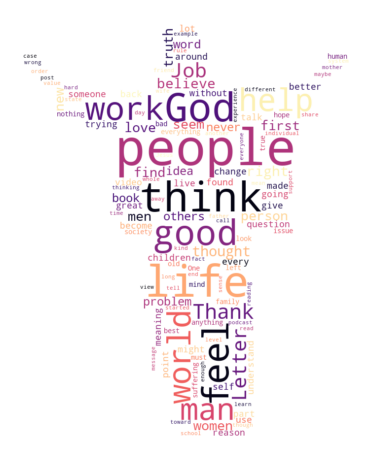

In [35]:
#for comments

mask = np.array(Image.open("C:/Users/reigh/Desktop/Stupid pics/nazzy.png"))

wordcloud = WordCloud(width=40000, 
                     height=30000, 
                     random_state=10, 
                     max_font_size=200,
                     mask=mask,
                     background_color='white',
                     max_words=125,
                     colormap='magma').generate(all_hot_lem_com)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off');

In [222]:
sentiment_score(all_hot_lem_com)

Overall sentiment of dictionary:  {'neg': 0.122, 'neu': 0.688, 'pos': 0.189, 'compound': 1.0}
Sentiment seems:  12.2 % Negative
Sentiment seems:  68.8 % Neutral
Sentiment seems:  18.9 % Positive
Sentiment rating overall Neutral


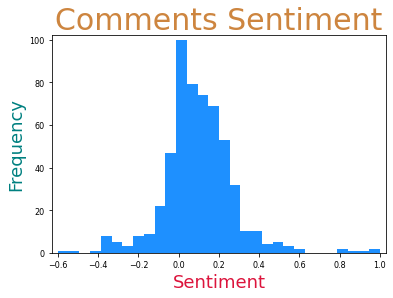

In [37]:
plt.figure(figsize=(6,4))
plt.margins(0.02)
plt.xlabel('Sentiment', fontsize=18, color='crimson')
plt.xticks(fontsize=8)
plt.ylabel('Frequency', fontsize=18, color='teal')
plt.yticks(fontsize=8)
plt.hist(jor_hot_df['sentiment'], bins=30, color='dodgerblue')
plt.title('Comments Sentiment', fontsize=30, color='peru')
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



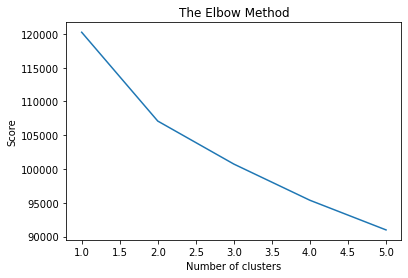

In [43]:
k_clusters = 5



score = []
for i in range(1,k_clusters + 1):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=5000,n_init=10,random_state=42)
    kmeans.fit(X3)
    score.append(kmeans.inertia_)
plt.plot(range(1,k_clusters + 1 ), score)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Score')
plt.savefig('elbow.png')
plt.show()

In [44]:
k = 2
model = KMeans(n_clusters=k, init='k-means++', max_iter=2000, n_init=10, random_state=42)
model.fit(X3)

KMeans(max_iter=2000, n_clusters=2, random_state=42)

In [45]:
jor_hot_df['clusters'] = model.labels_

In [46]:
#Finding cluster centroids


order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vector.get_feature_names_out()

for i in range(k):
    print("Clusters %d:" % i)
    for j in order_centroids[i, :10]: #number of centroid labels
        print (' %s' % terms[j])
    print('------------')

Clusters 0:
 people
 life
 think
 good
 feel
 men
 work
 world
 god
 letter
------------
Clusters 1:
 god
 job
 suffering
 life
 good
 man
 right
 divine
 children
 his
------------


In [47]:
pca = PCA(n_components=2, random_state=0)
pca_vecs = pca.fit_transform(X3)

In [48]:
x0 = pca_vecs[:, 0]
x1 = pca_vecs[:, 1]

In [49]:
jor_hot_df['x0'] = x0
jor_hot_df['x1'] = x1

In [50]:
cluster_map = {0: "God, Job, Suffering, Life, Order", 1: "Life, People, God, Good, Think, letter"}
jor_hot_df['clusters'] = jor_hot_df['clusters'].map(cluster_map)

In [51]:
fig = px.scatter(jor_hot_df, x='x0', y='x1',
                 color='clusters', symbol='clusters',
                 hover_data=['clusters'],
                log_x=True)
            
fig.update_layout(
    title="Clustering for Reddit Hot posts",
    xaxis_title="",
    yaxis_title="",
    legend_title="Top Clusters")

fig.update_traces(marker_size=7)
fig.show()

______________________________________________________________________________________________________
## Scraping 'new' posts...
______________________________________________________________________________________________________

In [52]:
#'New' posts

dict_jor_new = {"title":[], 
                "subreddit":[], 
                "score":[], 
                "id":[], 
                "url":[], 
                "comms_num":[], 
                "created":[], 
                "body":[],
                "created_utc":[],
               "upvote_ratio":[]} 

In [53]:
for submission in new:
    dict_jor_new["title"].append(submission.title)
    dict_jor_new['subreddit'].append(submission.subreddit)
    dict_jor_new["score"].append(submission.score)
    dict_jor_new["id"].append(submission.id)
    dict_jor_new["url"].append(submission.url)
    dict_jor_new["comms_num"].append(submission.num_comments)
    dict_jor_new["created"].append(submission.created)
    dict_jor_new["body"].append(submission.selftext)
    dict_jor_new["created_utc"].append(submission.created_utc)
    dict_jor_new["upvote_ratio"].append(submission.upvote_ratio)

In [54]:
jor_new = pd.DataFrame(dict_jor_new)
jor_new = jor_new.rename(columns={"body":"comments"})
jor_new.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio
0,Fear of my world,JordanPeterson,2,xe698v,https://www.reddit.com/r/JordanPeterson/commen...,1,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...",1.663173e+09,1.00
1,[Letter],JordanPeterson,1,xe68zm,https://www.reddit.com/r/JordanPeterson/commen...,3,1.663173e+09,Hear me out. I mostly considered myself leftis...,1.663173e+09,0.99
2,Performance enhancing music - motivation?,JordanPeterson,1,xe64vy,https://www.reddit.com/r/JordanPeterson/commen...,0,1.663172e+09,"Hey y'all, \nAs knowledge is only part of th...",1.663172e+09,1.00


In [55]:
#saving df
jor_new.to_csv("jor_new.csv", na_rep='NULL')

In [56]:
jor_new_df = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/jor_new.csv')
jor_new_df = jor_new_df.dropna()
jor_new_df = jor_new_df.drop(columns=['Unnamed: 0'], axis=0)
jor_new_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio
0,Fear of my world,JordanPeterson,2,xe698v,https://www.reddit.com/r/JordanPeterson/commen...,1,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...",1.663173e+09,1.00
1,[Letter],JordanPeterson,1,xe68zm,https://www.reddit.com/r/JordanPeterson/commen...,3,1.663173e+09,Hear me out. I mostly considered myself leftis...,1.663173e+09,0.99
2,Performance enhancing music - motivation?,JordanPeterson,1,xe64vy,https://www.reddit.com/r/JordanPeterson/commen...,0,1.663172e+09,"Hey y'all, \nAs knowledge is only part of th...",1.663172e+09,1.00


In [57]:
#Creating a combined column once again
jor_new_df['comm_t'] = jor_new_df['comments'] + jor_new_df['title']

#and tokenizing
jor_new_df['text_token']= jor_new_df['comm_t'].apply(regexp.tokenize)
jor_new_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio,comm_t,text_token
0,Fear of my world,JordanPeterson,2,xe698v,https://www.reddit.com/r/JordanPeterson/commen...,1,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...",1.663173e+09,1.00,"Dear Mr. Peterson,\n lately I've been stressed...","[Dear, Mr, Peterson, lately, I, ve, been, stre..."
1,[Letter],JordanPeterson,1,xe68zm,https://www.reddit.com/r/JordanPeterson/commen...,3,1.663173e+09,Hear me out. I mostly considered myself leftis...,1.663173e+09,0.99,Hear me out. I mostly considered myself leftis...,"[Hear, me, out, I, mostly, considered, myself,..."
2,Performance enhancing music - motivation?,JordanPeterson,1,xe64vy,https://www.reddit.com/r/JordanPeterson/commen...,0,1.663172e+09,"Hey y'all, \nAs knowledge is only part of th...",1.663172e+09,1.00,"Hey y'all, \nAs knowledge is only part of th...","[Hey, y, all, As, knowledge, is, only, part, o..."


In [58]:
stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one',
                'even', 'ways', 'the', 'like', 'peterson', 'get', 'could', 'how',
                'Jordan', 'Peterson', 'jordan', 'peterson', 'The', 'And', 'and', 'see', 'How', 
                'Can', 'can', 'would', 'could', 'JBP', 'jpb', 'say', 'want', 'much', 'also',
                'but', 'many', 'But', 'got', 'some', 'they', 'etc', 'something', 'with', 'far',
                'one', 'two', 'three', 'four', 'five', 'six', 'seven', 'for', 'html', 'food',
                'probably', 'recently', 'regardless', 'links', 'data', 'almost', 'simply',
                'days', 'personal', 'facing', 'and', 'regards', 'simple', 'into', 'else',
                'admits', 'admit', 'place', 'what', 'does', 'why', 'whose', 'when', 'put',
                'behind', 'redd', 'low', 'goes', 'know', 'time', 'may', 'com', 'This',
                'come', 'really', 'thing', 'things', 'make', 'makes', 'year', 'years', 'www',
                'does', 'Does', 'Why', 'What', 'x200B', 'well', 'back', 'They', 'said', 'They',
                'Who', 'some', 'going', 'might', 'may', 'another', 'look', 'When', 'Way',
                'long', 'least', 'must', 'sure', 'try', 'make', 'You']

stopwords.extend(my_stopwords)

jor_new_df['text_token'] = jor_new_df['text_token'].apply(lambda x: [item for item in x if item not in stopwords])


#removing two letter words
jor_new_df['text_string'] = jor_new_df['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
jor_new_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio,comm_t,text_token,text_string
0,Fear of my world,JordanPeterson,2,xe698v,https://www.reddit.com/r/JordanPeterson/commen...,1,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...",1.663173e+09,1.00,"Dear Mr. Peterson,\n lately I've been stressed...","[Dear, Mr, lately, I, stressed, fear, world, l...",Dear lately stressed fear world live Christian...
1,[Letter],JordanPeterson,1,xe68zm,https://www.reddit.com/r/JordanPeterson/commen...,3,1.663173e+09,Hear me out. I mostly considered myself leftis...,1.663173e+09,0.99,Hear me out. I mostly considered myself leftis...,"[Hear, I, mostly, considered, leftist, life, P...",Hear mostly considered leftist life Pro green ...
2,Performance enhancing music - motivation?,JordanPeterson,1,xe64vy,https://www.reddit.com/r/JordanPeterson/commen...,0,1.663172e+09,"Hey y'all, \nAs knowledge is only part of th...",1.663172e+09,1.00,"Hey y'all, \nAs knowledge is only part of th...","[Hey, As, knowledge, part, battle, wondering, ...",Hey knowledge part battle wondering music moti...


In [59]:
all_new_com = ' '.join([word for word in jor_new_df['text_string']])
tokenized_words9 = nltk.tokenize.word_tokenize(all_new_com)

fdist9 = FreqDist(tokenized_words9)
print(fdist9.most_common(100))

[('people', 395), ('life', 287), ('God', 266), ('think', 241), ('good', 187), ('feel', 165), ('world', 147), ('right', 141), ('man', 141), ('work', 138), ('help', 135), ('Letter', 132), ('men', 127), ('person', 113), ('believe', 112), ('need', 111), ('love', 101), ('first', 101), ('find', 100), ('others', 100), ('take', 99), ('women', 97), ('Job', 97), ('never', 96), ('still', 93), ('self', 92), ('someone', 88), ('better', 88), ('made', 87), ('around', 85), ('children', 84), ('truth', 84), ('every', 82), ('question', 79), ('understand', 79), ('always', 79), ('family', 78), ('without', 78), ('day', 77), ('wrong', 76), ('thought', 75), ('For', 75), ('anyone', 75), ('great', 75), ('problem', 74), ('become', 74), ('ever', 74), ('society', 74), ('found', 73), ('new', 72), ('book', 72), ('trying', 72), ('thoughts', 72), ('give', 71), ('nothing', 71), ('able', 71), ('change', 70), ('suffering', 70), ('left', 69), ('meaning', 69), ('Jesus', 69), ('part', 68), ('point', 68), ('use', 68), ('Than

In [60]:
y = [count for tag, count in fdist9.most_common(20)]
x = [tag for tag, count in fdist9.most_common(20)]

fig = px.bar(jor_new_df, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Top 20 words for Reddit 'new' comments",
    xaxis_title="Times Used",
    yaxis_title="Most Used Words",
    legend_title="Legend Title")

fig.show()

______________________________________________________________________________________________________
Honestly I have no idea what this 'Letter' is...and it's driving me mad.
______________________________________________________________________________________________________

In [61]:
jor_new_df['text_string_fdist'] = jor_new_df['text_token'].apply(lambda x: ' '.join([item for item in x if fdist7[item] >= 1 ]))

wordnet_lem = WordNetLemmatizer()

jor_new_df['text_string_lem'] = jor_new_df['text_string_fdist'].apply(wordnet_lem.lemmatize)

all_new_lem_com = ' '.join([word for word in jor_new_df['text_string_lem']])

In [62]:
jor_new_df['sentiment'] = jor_new_df['text_string_lem'].apply(lambda x: TextBlob(x).sentiment.polarity)

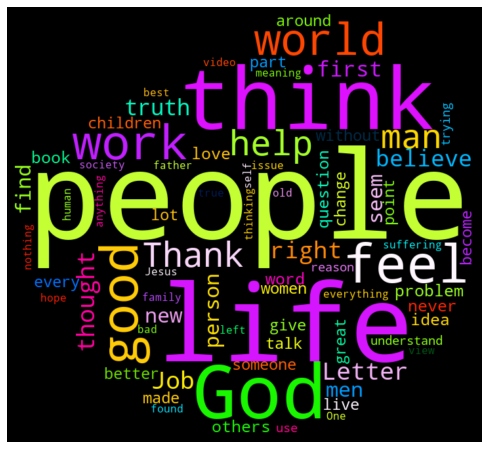

In [63]:
mask = np.array(Image.open("C:/Users/reigh/Desktop/Stupid pics/blob.png"))

wordcloud = WordCloud(width=5000, 
                     height=3000, 
                     random_state=10, 
                     max_font_size=200,
                     mask=mask,
                     background_color='black',
                     max_words=75,
                     colormap='gist_ncar').generate(all_new_lem_com)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off');

In [64]:
sentiment_score(all_new_lem_com)

Overall sentiment of dictionary:  {'neg': 0.122, 'neu': 0.691, 'pos': 0.187, 'compound': 1.0}
Sentiment seems:  12.2 % Negative
Sentiment seems:  69.1 % Neutral
Sentiment seems:  18.7 % Positive
Sentiment rating overall Neutral


In [65]:
jor_new_df['sentiment'] = jor_new_df['text_string_lem'].apply(lambda x: TextBlob(x).sentiment.polarity)

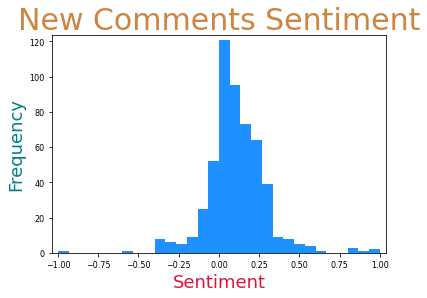

In [66]:
plt.figure(figsize=(6,4))
plt.margins(0.02)
plt.xlabel('Sentiment', fontsize=18, color='crimson')
plt.xticks(fontsize=8)
plt.ylabel('Frequency', fontsize=18, color='teal')
plt.yticks(fontsize=8)
plt.hist(jor_new_df['sentiment'], bins=30, color='dodgerblue')
plt.title('New Comments Sentiment', fontsize=30, color='peru')
plt.show()

______________________________________________________________________________________________________
## And finally for 'top' posts...
______________________________________________________________________________________________________

In [67]:
#Top

dict_jor_top = {"title":[], 
                "subreddit":[], 
                "score":[], 
                "id":[], 
                "url":[], 
                "comms_num":[], 
                "created":[], 
                "body":[],
                "created_utc":[],
                "upvote_ratio":[]} 

In [68]:
for submission in top:
    dict_jor_top["title"].append(submission.title)
    dict_jor_top['subreddit'].append(submission.subreddit)
    dict_jor_top["score"].append(submission.score)
    dict_jor_top["id"].append(submission.id)
    dict_jor_top["url"].append(submission.url)
    dict_jor_top["comms_num"].append(submission.num_comments)
    dict_jor_top["created"].append(submission.created)
    dict_jor_top["body"].append(submission.selftext)
    dict_jor_top["created_utc"].append(submission.created_utc)
    dict_jor_top["upvote_ratio"].append(submission.upvote_ratio)

In [69]:
jor_top = pd.DataFrame(dict_jor_top)
jor_top = jor_top.rename(columns={"body":"comments"})
jor_top.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio
0,I’ve been seeing this post a lot and it really...,JordanPeterson,20352,hgsdlc,https://i.redd.it/h3rhuofo0g751.jpg,1757,1.593259e+09,,1.593259e+09,0.79
1,Elon Musk Truth Bomb,JordanPeterson,18205,abxlxo,https://i.redd.it/12lolmm9p2821.png,1939,1.546462e+09,,1.546462e+09,0.69
2,STOP. TRYING. TO. MAKE. THIS. SUB. A. RIGHT. W...,JordanPeterson,12199,h8on14,https://www.reddit.com/r/JordanPeterson/commen...,2005,1.592116e+09,I’ve been seeing a high frequency of posts tha...,1.592116e+09,0.79


In [70]:
jor_top.to_csv("jor_top.csv", na_rep='NULL')

In [71]:
jor_top_df = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/jor_top.csv')
jor_top_df = jor_top_df.dropna()
jor_top_df = jor_top_df.drop(columns=['Unnamed: 0'], axis=0)
jor_top_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio
2,STOP. TRYING. TO. MAKE. THIS. SUB. A. RIGHT. W...,JordanPeterson,12199,h8on14,https://www.reddit.com/r/JordanPeterson/commen...,2005,1.592116e+09,I’ve been seeing a high frequency of posts tha...,1.592116e+09,0.79
13,"This may get downvoted, but you need to read t...",JordanPeterson,7229,gwfmu2,https://www.reddit.com/r/JordanPeterson/commen...,1056,1.591270e+09,The reason that you are seeing this post in th...,1.591270e+09,0.79
82,This subreddit is way to toxic.,JordanPeterson,4039,di5oi5,https://www.reddit.com/r/JordanPeterson/commen...,851,1.571134e+09,"As a big JP Fan, I came here expecting smart c...",1.571134e+09,0.85


In [72]:
jor_top_df.shape

(30, 10)

In [73]:
fig = px.scatter(jor_top_df, x='score', y='comms_num', color='comms_num', trendline="ols")
fig.show()

In [74]:
#again combining the columns

jor_top_df['comm_t'] = jor_top_df['comments'] + jor_top_df['title']

jor_top_df['text_token']= jor_top_df['comm_t'].apply(regexp.tokenize)
jor_top_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio,comm_t,text_token
2,STOP. TRYING. TO. MAKE. THIS. SUB. A. RIGHT. W...,JordanPeterson,12199,h8on14,https://www.reddit.com/r/JordanPeterson/commen...,2005,1.592116e+09,I’ve been seeing a high frequency of posts tha...,1.592116e+09,0.79,I’ve been seeing a high frequency of posts tha...,"[I, ve, been, seeing, a, high, frequency, of, ..."
13,"This may get downvoted, but you need to read t...",JordanPeterson,7229,gwfmu2,https://www.reddit.com/r/JordanPeterson/commen...,1056,1.591270e+09,The reason that you are seeing this post in th...,1.591270e+09,0.79,The reason that you are seeing this post in th...,"[The, reason, that, you, are, seeing, this, po..."
82,This subreddit is way to toxic.,JordanPeterson,4039,di5oi5,https://www.reddit.com/r/JordanPeterson/commen...,851,1.571134e+09,"As a big JP Fan, I came here expecting smart c...",1.571134e+09,0.85,"As a big JP Fan, I came here expecting smart c...","[As, a, big, JP, Fan, I, came, here, expecting..."


In [75]:
#Applying cleaning functions

stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one',
                'even', 'ways', 'the', 'like', 'peterson', 'get', 'could', 'how',
                'Jordan', 'Peterson', 'jordan', 'peterson', 'The', 'And', 'and', 'see', 'How', 
                'Can', 'can', 'would', 'could', 'JBP', 'jpb', 'say', 'want', 'much', 'also',
                'but', 'many', 'But', 'got', 'some', 'they', 'etc', 'something', 'with', 'far',
                'one', 'two', 'three', 'four', 'five', 'six', 'seven', 'for', 'html', 'food',
                'probably', 'recently', 'regardless', 'links', 'data', 'almost', 'simply',
                'days', 'personal', 'facing', 'and', 'regards', 'simple', 'into', 'else',
                'admits', 'admit', 'place', 'what', 'does', 'why', 'whose', 'when', 'put',
                'behind', 'redd', 'low', 'goes', 'know', 'time', 'may', 'com', 'This',
                'come', 'really', 'thing', 'things', 'make', 'makes', 'year', 'years', 'www',
                'does', 'Does', 'Why', 'What', 'x200B', 'well', 'back', 'They', 'said', 'They',
                'Who', 'some', 'That', 'still', 'posts', 'post', 'sub', 'subreddit', 'You',
                'users', 'admin', 'need', 'none', 'non', 'another', 'tried', 'lot', 'instead',
                'day', 'talking', 'going']

stopwords.extend(my_stopwords)

jor_top_df['text_token'] = jor_top_df['text_token'].apply(lambda x: [item for item in x if item not in stopwords])

#removing two letter words
jor_top_df['text_string'] = jor_top_df['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))

jor_top_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio,comm_t,text_token,text_string
2,STOP. TRYING. TO. MAKE. THIS. SUB. A. RIGHT. W...,JordanPeterson,12199,h8on14,https://www.reddit.com/r/JordanPeterson/commen...,2005,1.592116e+09,I’ve been seeing a high frequency of posts tha...,1.592116e+09,0.79,I’ve been seeing a high frequency of posts tha...,"[I, seeing, high, frequency, literally, right,...",seeing high frequency literally right wing pro...
13,"This may get downvoted, but you need to read t...",JordanPeterson,7229,gwfmu2,https://www.reddit.com/r/JordanPeterson/commen...,1056,1.591270e+09,The reason that you are seeing this post in th...,1.591270e+09,0.79,The reason that you are seeing this post in th...,"[reason, seeing, people, work, Dr, rather, stu...",reason seeing people work rather stuff Liberal...
82,This subreddit is way to toxic.,JordanPeterson,4039,di5oi5,https://www.reddit.com/r/JordanPeterson/commen...,851,1.571134e+09,"As a big JP Fan, I came here expecting smart c...",1.571134e+09,0.85,"As a big JP Fan, I came here expecting smart c...","[As, big, JP, Fan, I, came, expecting, smart, ...",big Fan came expecting smart conversations arg...


In [76]:
#For title, people are much more dramatic for click-bait than in actuality it seems

all_top = ' '.join([word for word in jor_top_df['text_string']])
tokenized_words10 = nltk.tokenize.word_tokenize(all_top)

top = FreqDist(tokenized_words10)
print(top.most_common(150))

[('life', 35), ('people', 34), ('right', 20), ('speech', 19), ('never', 14), ('told', 12), ('wing', 11), ('political', 11), ('everything', 10), ('comments', 10), ('think', 9), ('around', 9), ('free', 9), ('first', 9), ('salary', 9), ('work', 8), ('read', 8), ('others', 8), ('community', 8), ('job', 8), ('take', 7), ('family', 7), ('keep', 7), ('telling', 7), ('good', 7), ('anything', 7), ('University', 7), ('Tammy', 7), ('black', 7), ('employees', 7), ('expect', 6), ('better', 6), ('feel', 6), ('everyone', 6), ('man', 6), ('advice', 6), ('enough', 6), ('event', 6), ('discussion', 6), ('thought', 6), ('content', 6), ('men', 6), ('radical', 6), ('reason', 5), ('self', 5), ('actually', 5), ('help', 5), ('Edit', 5), ('saying', 5), ('system', 5), ('ever', 5), ('less', 5), ('watching', 5), ('let', 5), ('sent', 5), ('went', 5), ('someone', 5), ('rule', 5), ('remove', 5), ('left', 5), ('lymph', 5), ('dangerous', 5), ('hope', 5), ('completely', 5), ('listening', 5), ('university', 5), ('hated',

In [77]:
y = [count for tag, count in top.most_common(20)]
x = [tag for tag, count in top.most_common(20)]

fig = px.bar(jor_new_df, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Top 20 words for Reddit 'Top' comments",
    xaxis_title="Times Used",
    yaxis_title="Most Used Words",
    legend_title="Legend Title")

fig.show()

In [78]:
jor_top_df['text_string_fdist'] = jor_top_df['text_token'].apply(lambda x: ' '.join([item for item in x if top[item] >= 1 ]))

In [79]:
jor_top_df['text_string_lem'] = jor_top_df['text_string_fdist'].apply(wordnet_lem.lemmatize)

all_top_lem = ' '.join([word for word in jor_top_df['text_string_lem']])

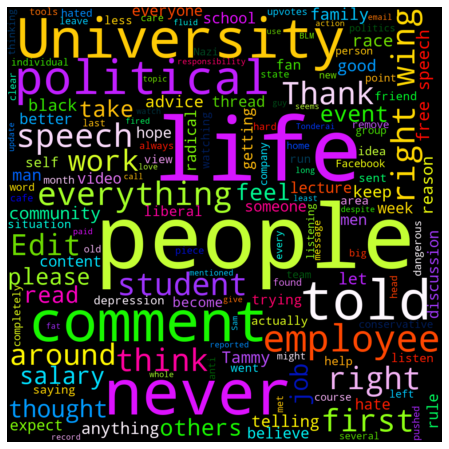

In [80]:
#comments

mask = np.array(Image.open("C:/Users/reigh/Desktop/Stupid pics/cic2.png"))

wordcloud = WordCloud(width=5000, 
                     height=3000, 
                     random_state=10, 
                     max_font_size=200,
                     mask=mask,
                     background_color='black',
                     max_words=150,
                     colormap='gist_ncar').generate(all_top_lem)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off');

In [81]:
sentiment_score(all_top_lem)

Overall sentiment of dictionary:  {'neg': 0.179, 'neu': 0.627, 'pos': 0.194, 'compound': 0.9927}
Sentiment seems:  17.9 % Negative
Sentiment seems:  62.7 % Neutral
Sentiment seems:  19.400000000000002 % Positive
Sentiment rating overall Neutral


In [82]:
y = [count for tag, count in top.most_common(25)]
x = [tag for tag, count in top.most_common(25)]

fig = px.bar(jor_top_df, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Top 25 words for 'top' comments/titles",
    xaxis_title="Times Used",
    yaxis_title="Most Used Words",
    legend_title="Word-Color")

fig.show()

In [83]:
#Creating sentimentality columns for 'title' and 'comments' cleaned data

jor_top_df['sentiment'] = jor_top_df['text_string_lem'].apply(lambda x: TextBlob(x).sentiment.polarity)

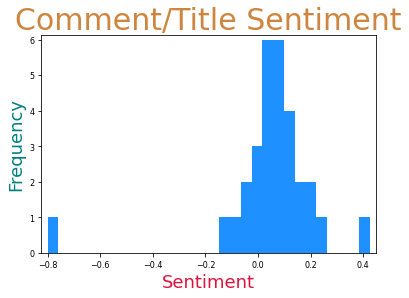

In [84]:
plt.figure(figsize=(6,4))
plt.margins(0.02)
plt.xlabel('Sentiment', fontsize=18, color='crimson')
plt.xticks(fontsize=8)
plt.ylabel('Frequency', fontsize=18, color='teal')
plt.yticks(fontsize=8)
plt.hist(jor_top_df['sentiment'], bins=30, color='dodgerblue')
plt.title('Comment/Title Sentiment', fontsize=30, color='peru')
plt.show()

In [85]:
jor_top_df.to_csv("jor_top.csv", na_rep='NULL')

______________________________________________________________________________________________________
## Combining `Top`, `New`, and `Hot` posts into single df:

I found this was the best way to assess all the data by increasing our size to garner decent results when processing and classifying.
______________________________________________________________________________________________________

In [86]:
df1 = pd.concat([jor_top_df, jor_hot_df], ignore_index=True)
mega_df = pd.concat([jor_new_df, df1], ignore_index=True)
mega_df.head(3)

,title,subreddit,score,id,url,comms_num,created,comments,created_utc,upvote_ratio,comm_t,text_token,text_string,text_string_fdist,text_string_lem,sentiment,comt_t,clusters,x0,x1
0,Fear of my world,JordanPeterson,2,xe698v,https://www.reddit.com/r/JordanPeterson/commen...,1,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...",1.663173e+09,1.00,"Dear Mr. Peterson,\n lately I've been stressed...","[Dear, Mr, lately, I, stressed, fear, world, l...",Dear lately stressed fear world live Christian...,Dear lately stressed fear world live Christian...,Dear lately stressed fear world live Christian...,0.008339,NaN,NaN,NaN,NaN
1,[Letter],JordanPeterson,1,xe68zm,https://www.reddit.com/r/JordanPeterson/commen...,3,1.663173e+09,Hear me out. I mostly considered myself leftis...,1.663173e+09,0.99,Hear me out. I mostly considered myself leftis...,"[Hear, I, mostly, considered, leftist, life, P...",Hear mostly considered leftist life Pro green ...,Hear mostly considered leftist life Pro green ...,Hear mostly considered leftist life Pro green ...,-0.038750,NaN,NaN,NaN,NaN
2,Performance enhancing music - motivation?,JordanPeterson,1,xe64vy,https://www.reddit.com/r/JordanPeterson/commen...,0,1.663172e+09,"Hey y'all, \nAs knowledge is only part of th...",1.663172e+09,1.00,"Hey y'all, \nAs knowledge is only part of th...","[Hey, As, knowledge, part, battle, wondering, ...",Hey knowledge part battle wondering music moti...,Hey knowledge part battle wondering music moti...,Hey knowledge part battle wondering music moti...,0.220000,NaN,NaN,NaN,NaN


In [87]:
#saving to df
mega_df.to_csv("jor_all.csv", na_rep='NULL')

In [5]:
#running from df
all_jor = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/jor_all.csv')
all_jor.head(3)

,Unnamed: 0,title,subreddit,score,id,url,comms_num,created,comments,created_utc,...,comm_t,text_token,text_string,text_string_fdist,text_string_lem,sentiment,comt_t,clusters,x0,x1
0,0,Fear of my world,JordanPeterson,2,xe698v,https://www.reddit.com/r/JordanPeterson/commen...,1,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...",1.663173e+09,...,"Dear Mr. Peterson,\n lately I've been stressed...","['Dear', 'Mr', 'lately', 'I', 'stressed', 'fea...",Dear lately stressed fear world live Christian...,Dear lately stressed fear world live Christian...,Dear lately stressed fear world live Christian...,0.008339,NaN,NaN,NaN,NaN
1,1,[Letter],JordanPeterson,1,xe68zm,https://www.reddit.com/r/JordanPeterson/commen...,3,1.663173e+09,Hear me out. I mostly considered myself leftis...,1.663173e+09,...,Hear me out. I mostly considered myself leftis...,"['Hear', 'I', 'mostly', 'considered', 'leftist...",Hear mostly considered leftist life Pro green ...,Hear mostly considered leftist life Pro green ...,Hear mostly considered leftist life Pro green ...,-0.038750,NaN,NaN,NaN,NaN
2,2,Performance enhancing music - motivation?,JordanPeterson,1,xe64vy,https://www.reddit.com/r/JordanPeterson/commen...,0,1.663172e+09,"Hey y'all, \nAs knowledge is only part of th...",1.663172e+09,...,"Hey y'all, \nAs knowledge is only part of th...","['Hey', 'As', 'knowledge', 'part', 'battle', '...",Hey knowledge part battle wondering music moti...,Hey knowledge part battle wondering music moti...,Hey knowledge part battle wondering music moti...,0.220000,NaN,NaN,NaN,NaN


In [6]:
jor_all = all_jor[['title', 'comments', 'score', 'comms_num', 'sentiment', 'created_utc']]

In [7]:
jor_all.describe()

,score,comms_num,sentiment,created_utc
count,1114.000000,1114.000000,1114.000000,1.114000e+03
mean,96.313285,29.548474,0.099175,1.660300e+09
std,582.420103,106.364475,0.183414,1.259788e+07
min,0.000000,0.000000,-1.000000,1.526138e+09
25%,0.000000,1.000000,0.000000,1.661857e+09
50%,1.000000,3.000000,0.088095,1.662314e+09
75%,4.000000,12.000000,0.199025,1.662747e+09
max,12199.000000,2005.000000,1.000000,1.663173e+09


______________________________________________________________________________________________________
Reading comments before breaking them down to get a sense of general conversation
______________________________________________________________________________________________________

In [27]:
jor_all['comments'][168]

' I think we all have had situations where we want to say something but we stop ourselves to avoid hurting people\'s feelings because keeping the peace is often more preferable than telling that joke or making that remark. However it seems that for a large group of people they consider it oppression, domination or a societal flaw while it is so important for a person to show restraint when living in a society.\n\n&#x200B;\n\n7 Billion people each with a different character, different opinions, different likes and dislikes. We\'re not going to get along if we just do and say what we want.  And we aren\'t getting along anymore. The internet gave everyone access to everyone else so while in the past people would just know others from their immediate area now suddenly people get in contact with others from anywhere else. Different cultures, different idea, different world views.\n\n&#x200B;\n\nNow it\'s even more important to show restraint but the opposite is happening. People are willing

In [25]:
jor_all['comments'][147]

'I’ve taking the big 5 personality test twice, with two years apart. In my first test I got a 97% on openness to Experience. In my second I got 100%. Is this normal or rare? What does this mean and what do I do about it?'

In [21]:
jor_all['comments'][1112]

"I've followed Jordan Peterson's works for about three years now, and I like how he outlines personality traits and some of the pros and cons of each trait.\n\nI've had a hard time finding work-life balance recently, and it's starting to affect my family a lot. I was hoping someone can point me toward some of his talks or specific parts of his books that talk about finding balance between work life and family life.\n\nThanks for any help you can give."

In [28]:
jor_all['comments'][153]

"Peterson's lectures, books, and self authoring program helped me navigate my way out of dark rut back in 2018. Probably like many of you, I found his advice very practical and saw immediate improvements once I started pointing up in life, making sacrifices, and voluntarily taking on responsibilities. But I'd always put off making amends with my father, with whom I had a very surface-level and lackluster relationship. We'd talk a handful of times a year but it was always just him ranting about the economy and never much else. \n\nFinally built up the courage to talk about the state of our non-relationship with him and how I'd like more, and we ended up having a very good talk full of tears and hugs. Felt like we aired out a lot of tension that had been swept under the rug. It was a burden I carried around for years that I can finally let go of. And I'm grateful to have had this talk while the man is still alive, as this could've easily been a topic that was pushed off forever. \n\nSo, 

In [24]:
jor_all['comments'][53]

'I have a 26 year old family member who is a drug addict  now incarcerated in a Kentucky prison.  I do not think the rehab programs are much to proverbially "write home about."  Does anyone have any suggestions as to what a potential next-step might be?  Typical case of a smart, nice-person addict who needs help.\n\nThank you for any help you might supply.'

In [34]:
#Interesting comment from a 14 year old Muslim private school student from the UK

jor_all['comments'][35]

'Dr. Peterson - I am a avid consumer of your work. I am also a lawyer in Alberta and have recently received notice from my professional governing body that if I did not complete a program known as "The Path", which is being portrayed as a "Indigenous Cultural Competency Education Requirement", by a certain date, I would be suspended from practicing law in Alberta. This is a requirement of all members of the Alberta Law Society. \n\nIn short, if I want to engage in my profession, I have to complete a course that may be interesting and even enlightening, is in no way helpful to me professionally. They are also very biased in their presentation. I do not practice any form of aboriginal law, and while I have had First Nations clients, I have treated them the same as all my other clients with no complaints. \n\nI am not brave or perhaps willing enough to formally and publicly take issue with this, as I have a busy professional and family life that is more than enough to fill my plate curren

In [9]:
jor_all['comments'][397]

'I listened to a JBP podcast on Spotify a month or so ago that was Jordan reposting a lecture/speech on C19 and all the various things that have people feeling the way they do. It even unpacked the kickback system in medicine, and how the system ended up this way. I’d love to listen again, but for life of me I can’t find it. I even looked my Spotify history and nothing is ringing a bell. \n\nAnybody know which episode that was or who that lecturer was? It was by far the most balanced explanation to the psychology of covid from all sides I’ve ever heard.'

In [10]:
jor_all['comments'][0]

"Dear Mr. Peterson,\n lately I've been stressed and in fear of this world we live in now. I'm a Christian, a set in stone libertarian, and a veteran. I don't have a problem with my identity or options but as the left become more radical and violent I fear for my wife, newborn, and my future in the USA. How do I find the courage to voice my opinion follow my religion, and live feeling proud in my country with the way our country is headed. I believe I do right by God but to my fellow Americans and even the president I'm seen as sexist, racist, and now a violent extremist just for believing in traditional Christian beliefs. I follow politics closely and it seems like we are headed to an America where I'll have no rights and be prosecuted for my beliefs. It's seems everyday we slowly have more and more rights stripped from us. Our corrupt members of the goverment get off scott free or the evidence is buried never to be surfaced. I try to follow your rules but it seems I can't become happy

In [11]:
jor_all['comments'][110]

"I took the big five test and one thing that stuck out to me was that I'm super low in politeness. Although in real life I don't feel like I'm ever rude or impolite to people. But I do think I tend to be straightforward and not apt to sugar coat my social interactions. I guess if politeness is related to rudeness or if you can be impolite without being rude? I dont know if Im understanding what is meant by politeness honestly."

In [12]:
jor_all['comments'][1]

"Hear me out. I mostly considered myself leftist for most of my life. Pro green energy, Pro choice, at the same time I was for little government control, proper environment for small and medium business.\n\nAt the same time, being a sober alcoholic and understanding mechanisms and going through proper therapy, thought me so much that I support And agree with 99% of Dr. Jordan's ideas and comments.\n\nIs this strange?\n\nMarceli"

In [35]:
jor_all['comm_t'] = jor_all['comments'] + jor_all['title']


regexp = RegexpTokenizer('\w+')

jor_all['text_token']= jor_all['comm_t'].apply(regexp.tokenize)
jor_all.head(3)

C:\Users\reigh\AppData\Local\Temp\ipykernel_16944\275980436.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jor_all['comm_t'] = jor_all['comments'] + jor_all['title']
C:\Users\reigh\AppData\Local\Temp\ipykernel_16944\275980436.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jor_all['text_token']= jor_all['comm_t'].apply(regexp.tokenize)


,title,comments,score,comms_num,sentiment,created_utc,comm_t,text_token
0,Fear of my world,"Dear Mr. Peterson,\n lately I've been stressed...",2,1,0.008339,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...","[Dear, Mr, Peterson, lately, I, ve, been, stre..."
1,[Letter],Hear me out. I mostly considered myself leftis...,1,3,-0.038750,1.663173e+09,Hear me out. I mostly considered myself leftis...,"[Hear, me, out, I, mostly, considered, myself,..."
2,Performance enhancing music - motivation?,"Hey y'all, \nAs knowledge is only part of th...",1,0,0.220000,1.663172e+09,"Hey y'all, \nAs knowledge is only part of th...","[Hey, y, all, As, knowledge, is, only, part, o..."


In [36]:
stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one',
                'even', 'ways', 'the', 'like', 'peterson', 'get', 'could', 'how',
                'Jordan', 'Peterson', 'jordan', 'peterson', 'The', 'And', 'and', 'see', 'How', 
                'Can', 'can', 'would', 'could', 'JBP', 'jpb', 'say', 'want', 'much', 'also',
                'but', 'many', 'But', 'got', 'some', 'they', 'etc', 'something', 'with', 'far',
                'one', 'two', 'three', 'four', 'five', 'six', 'seven', 'for', 'html', 'food',
                'probably', 'recently', 'regardless', 'links', 'data', 'almost', 'simply',
                'days', 'personal', 'facing', 'and', 'regards', 'simple', 'into', 'else',
                'admits', 'admit', 'place', 'what', 'does', 'why', 'whose', 'when', 'put',
                'behind', 'redd', 'low', 'goes', 'know', 'time', 'may', 'com', 'This',
                'come', 'really', 'thing', 'things', 'make', 'makes', 'year', 'years', 'www',
                'does', 'Does', 'Why', 'What', 'x200B', 'well', 'back', 'They', 'said', 'They',
                'Who', 'some', 'That', 'still', 'posts', 'post', 'sub', 'subreddit', 'You',
                'users', 'admin', 'need', 'none', 'non', 'another', 'lot', 'anyone', 'seems', 'seem',
                'able', 'must', 'sure', 'though', 'getting', 'word', 'words', 'keep', 'find',
                'part', 'try', 'around', 'use', 'There', 'first', 'point', 'always', 'his',
                'think', 'can', 'ask', 'yet', 'everyone', 'end', 'new', 'rather', 'maybe', 'someone',
                'His', 'share', 'done', 'often', 'based', 'comes', 'However', 'likely', 'like', 'given']

stopwords.extend(my_stopwords)

jor_all['text_token'] = jor_all['text_token'].apply(lambda x: [item for item in x if item not in stopwords])



#removing two letter words
jor_all['text_string'] = jor_all['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))

jor_all.head(3)

C:\Users\reigh\AppData\Local\Temp\ipykernel_16944\380518634.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jor_all['text_token'] = jor_all['text_token'].apply(lambda x: [item for item in x if item not in stopwords])
C:\Users\reigh\AppData\Local\Temp\ipykernel_16944\380518634.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jor_all['text_string'] = jor_all['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))


,title,comments,score,comms_num,sentiment,created_utc,comm_t,text_token,text_string
0,Fear of my world,"Dear Mr. Peterson,\n lately I've been stressed...",2,1,0.008339,1.663173e+09,"Dear Mr. Peterson,\n lately I've been stressed...","[Dear, Mr, lately, I, stressed, fear, world, l...",Dear lately stressed fear world live Christian...
1,[Letter],Hear me out. I mostly considered myself leftis...,1,3,-0.038750,1.663173e+09,Hear me out. I mostly considered myself leftis...,"[Hear, I, mostly, considered, leftist, life, P...",Hear mostly considered leftist life Pro green ...
2,Performance enhancing music - motivation?,"Hey y'all, \nAs knowledge is only part of th...",1,0,0.220000,1.663172e+09,"Hey y'all, \nAs knowledge is only part of th...","[Hey, As, knowledge, battle, wondering, go, mu...",Hey knowledge battle wondering music motivatio...


In [37]:
all_jor = ' '.join([word for word in jor_all['text_string']])
tokenized_words12 = nltk.tokenize.word_tokenize(all_jor)

In [38]:
freq_all = FreqDist(tokenized_words12)
print(freq_all.most_common(50))

[('people', 857), ('life', 626), ('God', 533), ('good', 394), ('feel', 346), ('world', 307), ('right', 304), ('man', 299), ('work', 298), ('help', 284), ('men', 274), ('Letter', 264), ('person', 240), ('believe', 230), ('women', 219), ('love', 215), ('others', 211), ('never', 209), ('take', 209), ('self', 194), ('better', 194), ('Job', 194), ('made', 185), ('children', 177), ('going', 174), ('truth', 171), ('family', 168), ('every', 168), ('day', 165), ('question', 161), ('understand', 161), ('without', 159), ('ever', 158), ('great', 158), ('become', 157), ('thought', 157), ('wrong', 155), ('might', 155), ('For', 154), ('trying', 153), ('found', 153), ('problem', 151), ('society', 150), ('give', 148), ('book', 148), ('thoughts', 148), ('nothing', 147), ('left', 145), ('meaning', 144), ('everything', 143)]


In [39]:
y = [count for tag, count in freq_all.most_common(15)]
x = [tag for tag, count in freq_all.most_common(15)]

fig = px.bar(jor_all, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Top 25 Words for 'Top', 'New', and 'Hot' JP Posts",
    xaxis_title="Frequency",
    yaxis_title="Words",
    legend_title="Color-Word")

fig.show()

In [40]:
jor_all['text_string'].describe()

count                                                  1114
unique                                                  579
top       Hello hope twelfth grade student Kitchener Ont...
freq                                                      4
Name: text_string, dtype: object

In [41]:
#Frequency
jor_all['text_string_fdist'] = jor_all['text_token'].apply(lambda x: ' '.join([item for item in x if freq_all[item] >= 1 ]))

#Lemmatizizing
jor_all['text_string_lem'] = jor_all['text_string_fdist'].apply(wordnet_lem.lemmatize)

In [42]:
all_jor_lem = ' '.join([word for word in jor_all['text_string_lem']])

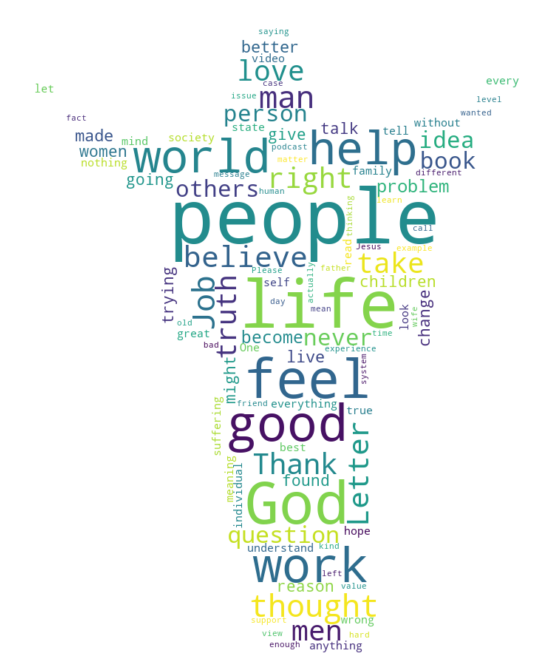

In [44]:
mask = np.array(Image.open("C:/Users/reigh/Desktop/Stupid pics/nazzy.png"))

wordcloud = WordCloud(width=5000, 
                     height=3000, 
                     random_state=10, 
                     max_font_size=222,
                     mask=mask,
                     background_color='white',
                     max_words=100,
                     colormap='viridis').generate(all_jor_lem)

plt.figure(figsize=(16, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off');

In [45]:
#Resetting sentiment from combined title/comment text lemat
jor_all['sentiment'] = jor_all['text_string_lem'].apply(lambda x: TextBlob(x).sentiment.polarity)

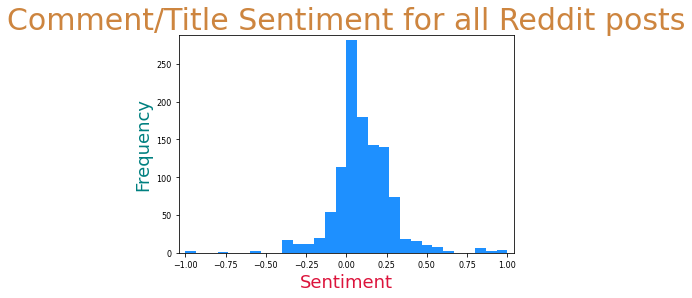

In [46]:
plt.figure(figsize=(6,4))
plt.margins(0.02)
plt.xlabel('Sentiment', fontsize=18, color='crimson')
plt.xticks(fontsize=8)
plt.ylabel('Frequency', fontsize=18, color='teal')
plt.yticks(fontsize=8)
plt.hist(jor_all['sentiment'], bins=30, color='dodgerblue')
plt.title('Comment/Title Sentiment for all Reddit posts', fontsize=30, color='peru')
plt.show()

In [47]:
sentiment_score(all_jor_lem)

Overall sentiment of dictionary:  {'neg': 0.158, 'neu': 0.601, 'pos': 0.241, 'compound': 1.0}
Sentiment seems:  15.8 % Negative
Sentiment seems:  60.099999999999994 % Neutral
Sentiment seems:  24.099999999999998 % Positive
Sentiment rating overall Neutral


______________________________________________________________________________________________________
## Classifying and Clustering
______________________________________________________________________________________________________

Starting with PCA/LogisticRegression()

In [61]:
X = jor_all['text_string_lem']
y = jor_all['sentiment']
lab = preprocessing.LabelEncoder()
y = lab.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

tf = TfidfVectorizer()

tf_X_train = tf.fit_transform(X_train).toarray()
tf_X_test = tf.transform(X_test).toarray()

tf_X_train.shape

(891, 11538)

In [62]:
COMPRESSED_SIZE = 800         

pca_model = PCA(COMPRESSED_SIZE)

pca_model.fit(tf_X_train)

PCA(n_components=800)

In [63]:
pca_train = pca_model.transform(tf_X_train) 
pca_test = pca_model.transform(tf_X_test)

tf_X_train.shape, pca_train.shape

((891, 11538), (891, 800))

In [70]:
model = LogisticRegression()
model.fit(pca_train,y_train)

preds = model.predict(pca_test)

print(classification_report(y_test,preds, zero_division=0))
print(f1_score(y_test,preds, zero_division=0, average='micro'))

              precision    recall  f1-score   support

           7       0.00      0.00      0.00         1
          10       0.00      0.00      0.00         1
          12       0.00      0.00      0.00         1
          13       0.00      0.00      0.00         1
          14       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         1
          21       0.00      0.00      0.00         2
          22       0.00      0.00      0.00         1
          24       0.00      0.00      0.00         1
          25       0.00      0.00      0.00         1
          30       0.00      0.00      0.00         1
          31       0.00      0.00      0.00         1
          34       0.00      0.00      0.00         1
          36       0.00      0.00      0.00         1
          38       0.00      0.00      0.00         1
          41       0.00      0.00      0.00         1
          47       0.00      0.00      0.00         1
          49       0.00    

## CountVectorizer/LogisticRegression() without compression
______________________________________________________________________________________________________

In [71]:
vectorizer = CountVectorizer()
tf = TfidfTransformer()

X = jor_all['text_string_lem']
y = jor_all['sentiment']

lab = preprocessing.LabelEncoder()
y = lab.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)


X_train = vectorizer.fit_transform(X_train) 
X_train = tf.fit_transform(X_train)         

X_test = vectorizer.transform(X_test)       
X_test = tf.transform(X_test)  

log_model = LogisticRegression().fit(X_train,y_train)

preds = log_model.predict(X_test)

print(classification_report(y_test,preds, zero_division=0))
print(f1_score(y_test,preds, zero_division=0, average='micro'))

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         2
          10       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         1
          18       0.00      0.00      0.00         1
          19       0.00      0.00      0.00         1
          20       0.00      0.00      0.00         1
          21       0.00      0.00      0.00         2
          23       0.00      0.00      0.00         1
          31       0.00      0.00      0.00         1
          33       0.00      0.00      0.00         1
          34       0.00      0.00      0.00         1
          36       0.00      0.00      0.00         1
          37       0.00    

## CountVectorizer/RandomForestClassifier()
______________________________________________________________________________________________________

In [67]:
vector = CountVectorizer()

X = vector.fit_transform(jor_all['text_string_lem']).toarray()
y = jor_all['sentiment']

#transform to deal with continuous values of sentiment
lab = preprocessing.LabelEncoder()
y = lab.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [72]:
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)
print(classification_report(y_test, preds, zero_division=0))
print(f1_score(y_test,preds, zero_division=0, average='micro'))

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         2
          10       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         1
          18       0.00      0.00      0.00         1
          19       0.00      0.00      0.00         1
          20       0.00      0.00      0.00         1
          21       0.00      0.00      0.00         2
          23       0.00      0.00      0.00         1
          31       0.00      0.00      0.00         1
          33       0.00      0.00      0.00         1
          34       0.00      0.00      0.00         1
          36       0.00      0.00      0.00         1
          37       0.00    

In [113]:
jor_all.to_csv("jor_all_sen.csv", na_rep='NULL')

______________________________________________________________________________________________________
## Clustering:
______________________________________________________________________________________________________

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.



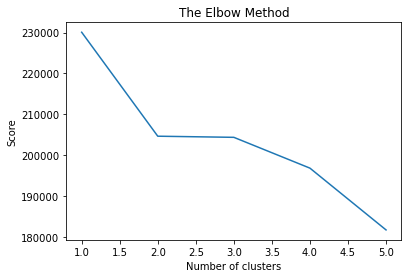

In [114]:
k_clusters = 5

score = []
for i in range(1,k_clusters + 1):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=1500,n_init=2, random_state=42)
    kmeans.fit(X5)
    score.append(kmeans.inertia_)
plt.plot(range(1,k_clusters + 1 ), score)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Score')
plt.savefig('elbow.png')
plt.show()

In [115]:
k = 2
model = KMeans(n_clusters=k, init='k-means++', max_iter=1500, n_init=2, random_state=42)
model.fit(X5)

KMeans(max_iter=1500, n_clusters=2, n_init=2, random_state=42)

In [116]:
jor_all['clusters'] = model.labels_

In [117]:
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vector.get_feature_names_out()

for i in range(k):
    print("Clusters %d:" % i)
    for j in order_centroids[i, :15]: #number of centroid labels
        print (' %s' % terms[j])
    print('------------')

Clusters 0:
 god
 job
 suffering
 life
 good
 man
 right
 divine
 children
 people
 great
 world
 coming
 revelation
 truth
------------
Clusters 1:
 people
 life
 good
 feel
 men
 work
 letter
 god
 world
 man
 right
 help
 women
 person
 thank
------------


In [118]:
pca = PCA(n_components=2, random_state=0)
pca_vecs = pca.fit_transform(X5)

x0 = pca_vecs[:, 0]
x1 = pca_vecs[:, 1]

In [119]:
jor_all['x0'] = x0
jor_all['x1'] = x1

cluster_map = {0: "God, Suffering, Divine, Revelation, Truth", 1: "People, Feel, God, Letter, Thank"}
jor_all['clusters'] = jor_all['clusters'].map(cluster_map)

In [120]:
fig = px.scatter(jor_all, x='x0', y='x1', color='clusters', symbol='clusters', log_x=True)
            
fig.update_layout(
    title="Clustering for Reddit Hot posts",
    xaxis_title="",
    yaxis_title="",
    legend_title="Top Clusters")

fig.update_traces(marker_size=10)
fig.show()

In [209]:
fig = px.scatter(jor_all, x='score', y='comms_num', color='comms_num', trendline="ols")
fig.show()

______________________________________________________________________________________________________
## Overall impressions from `Jordan Peterson` subreddit pulls:

   Several things have stuck out to me when working with the top/hot/new posts for JP, they can be almost as ambiguous as Jordan himself. However very quickly I began seeing comment after comment of prodominetly young men claiming their conversion to Christianity after partaking in his literature and materials. "God" is mentioned over 500 times "Jesus" over 100. There started to become a mimicking of his language within the top words, the first 4-5 top words of each fan conversation often has the same 4-5 top words as his books and speeches. "People", "Life", "God" often being high to the top of most lists. 
______________________________________________________________________________________________________

______________________________________________________________________________________________________
## Going deeper:
Using the url extraction method on particular posts within `non-Peterson related` subreddits that discuss him.This required a second import from the praw.metric 'MoreComments' that returned a usable single column df.
______________________________________________________________________________________________________

## Starting with the "Mens Rights" subreddit, subpost:
"Jordan Peterson Absolutely Obliterates Radical Feminist"

In [122]:
#Men's Rights Activist opinions
url = "https://www.reddit.com/r/MensRights/comments/fdodu0/jordan_peterson_absolutely_obliterates_radical/"
submission = reddit.submission(url=url)

In [123]:
corpus = []

for top_level_comment in submission.comments[1:]:
    if isinstance(top_level_comment, MoreComments):
        continue
    corpus.append(top_level_comment.body)

#applying cleaning to the element before secondary cleaning within dataframe   
corpus = web_cleaner(corpus)
mens_rights = pd.DataFrame(corpus, columns=["comments"])

In [124]:
#saving to .csv to keep/use for later without pulling

mens_rights.to_csv("mens_rights.csv", na_rep='NULL')

In [125]:
#Verifying the saved .csv

mens_rights = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/mens_rights.csv')
mens_rights = mens_rights.drop(columns=['Unnamed: 0'])
mens_rights.tail(3)

,comments
96,who s at the top who s in control who runs the...
97,deleted
98,thing is first of all how do they both know th...


In [126]:
#The fun part

mens_rights['text_token']= mens_rights['comments'].apply(regexp.tokenize)
mens_rights.head(3)

,comments,text_token
0,the vast majority of wealth is owned by men no...,"[the, vast, majority, of, wealth, is, owned, b..."
1,her only real counter argument to his position...,"[her, only, real, counter, argument, to, his, ..."
2,i kinda wanna see tyrannical roaming gangs of ...,"[i, kinda, wanna, see, tyrannical, roaming, ga..."


In [127]:
stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one', 'even', 'ways',
               'the', 'were', 'where', 'have', 'they', 'thing', 'many', 'comment', 'might', 'could', 'keep', 'back',
               'sub', 'comments', 'subs', 'things', 'this', 'www', 'like', 'pdf', 'see', 'say', 'come',
               'some', 'new', 'really', 'has', 'people', 'get', 'com', 'deleted', 'almost', 'would', 'make',
               'making', 'makes', 'want', 'point', 'jordan', 'peterson', 'percent']

stopwords.extend(my_stopwords)

mens_rights['text_token'] = mens_rights['text_token'].apply(lambda x: [item for item in x if item not in stopwords])

#removing two letter words
mens_rights['text_string'] = mens_rights['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
mens_rights.head(3)

,comments,text_token,text_string
0,the vast majority of wealth is owned by men no...,"[vast, majority, wealth, owned, men, nope, tru...",vast majority wealth owned men nope true globa...
1,her only real counter argument to his position...,"[real, counter, argument, position, statement,...",real counter argument position statement women...
2,i kinda wanna see tyrannical roaming gangs of ...,"[kinda, wanna, tyrannical, roaming, gangs, mal...",kinda wanna tyrannical roaming gangs male plum...


In [128]:
all_men = ' '.join([word for word in mens_rights['text_string']])
tokenized_words13 = nltk.tokenize.word_tokenize(all_men)

In [129]:
men = FreqDist(tokenized_words13)
print(men.most_common(50))

[('women', 41), ('men', 38), ('rape', 13), ('argument', 12), ('wealth', 11), ('female', 10), ('sexual', 10), ('male', 10), ('man', 10), ('society', 10), ('perpetrators', 9), ('woman', 9), ('right', 9), ('stemple', 8), ('labour', 7), ('think', 7), ('violence', 7), ('feminists', 7), ('arguments', 7), ('getting', 7), ('debate', 7), ('power', 7), ('true', 6), ('global', 6), ('fucking', 6), ('interview', 6), ('know', 5), ('someone', 5), ('form', 5), ('law', 5), ('ucla', 5), ('edu', 5), ('raped', 5), ('plumbers', 5), ('absolutely', 5), ('literally', 5), ('great', 5), ('video', 5), ('actually', 5), ('shit', 5), ('love', 5), ('vredditdownloader', 5), ('competence', 5), ('majority', 4), ('found', 4), ('hold', 4), ('news', 4), ('domestic', 4), ('unpaid', 4), ('paid', 4)]


In [130]:
y = [count for tag, count in men.most_common(15)]
x = [tag for tag, count in men.most_common(15)]

fig = px.bar(mens_rights, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Top 15 Mens Rights words about JP",
    xaxis_title="Frequency",
    yaxis_title="Words",
    legend_title="Color-Words")

fig.show()

In [131]:
mens_rights['text_string'].describe()

count     99
unique    90
top         
freq       6
Name: text_string, dtype: object

In [132]:
mens_rights['text_string_fdist'] = mens_rights['text_token'].apply(lambda x: ' '.join([item for item in x if men[item] >= 1 ]))

In [133]:
wordnet_lem = WordNetLemmatizer()

mens_rights['text_string_lem'] = mens_rights['text_string_fdist'].apply(wordnet_lem.lemmatize)

all_men_lem = ' '.join([word for word in mens_rights['text_string_lem']])

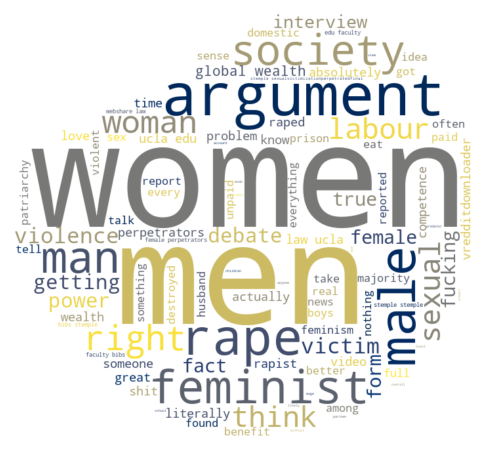

In [134]:
mask = np.array(Image.open("C:/Users/reigh/Desktop/Stupid pics/blob.png"))

wordcloud = WordCloud(width=5000, 
                     height=3000, 
                     random_state=10, 
                     max_font_size=222,
                     mask=mask,
                     background_color='white',
                     max_words=100,
                     colormap='cividis').generate(all_men_lem)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off');

In [135]:
sentiment_score(all_men_lem)

Overall sentiment of dictionary:  {'neg': 0.272, 'neu': 0.559, 'pos': 0.168, 'compound': -0.9998}
Sentiment seems:  27.200000000000003 % Negative
Sentiment seems:  55.900000000000006 % Neutral
Sentiment seems:  16.8 % Positive
Sentiment rating overall Neutral


______________________________________________________________________________________________________
## "On Guard for Thee" Canadian nationalist 'freedom' subreddit, sub:
"Twitter suspends Jordan Peterson's Account"
______________________________________________________________________________________________________

In [136]:
url = "https://www.reddit.com/r/onguardforthee/comments/vopl69/twitter_suspends_jordan_petersons_account_after/"
submission = reddit.submission(url=url)

In [137]:
corpus = []

for top_level_comment in submission.comments[1:]:
    if isinstance(top_level_comment, MoreComments):
        continue
    corpus.append(top_level_comment.body)

#applying cleaning to the element before secondary cleaning within dataframe   
corpus = web_cleaner(corpus)

ohcanada = pd.DataFrame(corpus, columns=["comments"])

In [138]:
#saving to .csv to keep/use for later without pulling

ohcanada.to_csv("ohcanada.csv", na_rep='NULL')

In [139]:
#Verifying the saved .csv

ohcanada = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/ohcanada.csv')
ohcanada = ohcanada.drop(columns=['Unnamed: 0'])
ohcanada.tail(3)

,comments
104,the guys is a nut case that had sex with his g...
105,so what did he say about the umbrella academy ...
106,i m quitting twitter https www youtube com wat...


In [140]:
#Tokenizing
ohcanada['text_token']= ohcanada['comments'].apply(regexp.tokenize)

#stop words, etc
stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one', 'even', 'ways',
               'the', 'were', 'where', 'have', 'they', 'thing', 'many', 'comment', 'might', 'could', 'keep', 'back',
               'sub', 'comments', 'subs', 'things', 'this', 'www', 'like', 'pdf', 'see', 'say', 'come',
               'some', 'new', 'really', 'has', 'people', 'get', 'com', 'blah', 'jordan', 'someone',
               'needs', 'first', 'got', 'peterson', 'removed']

stopwords.extend(my_stopwords)

ohcanada['text_token'] = ohcanada['text_token'].apply(lambda x: [item for item in x if item not in stopwords])

#removing two letter words
ohcanada['text_string'] = ohcanada['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
ohcanada.head(3)

,comments,text_token,text_string
0,lol wasn t he supposedly quitting twitter anyw...,"[lol, supposedly, quitting, twitter, anyways, ...",lol supposedly quitting twitter anyways made b...
1,he didn t even get suspended lmao bro just nee...,"[suspended, lmao, bro, delete, tweet, gonna, l...",suspended lmao bro delete tweet gonna locked d...
2,ohh no coming right after lich was arrested su...,"[ohh, coming, right, lich, arrested, good, sta...",ohh coming right lich arrested good start cana...


In [141]:
oh_can = ' '.join([word for word in ohcanada['text_string']])
tokenized_words14 = nltk.tokenize.word_tokenize(oh_can)

In [142]:
oh_can = FreqDist(tokenized_words14)
print(oh_can.most_common(50))

[('twitter', 11), ('good', 11), ('fuck', 11), ('right', 9), ('page', 9), ('tweet', 8), ('guy', 8), ('never', 7), ('thought', 7), ('article', 6), ('elliot', 6), ('drug', 6), ('person', 6), ('canada', 5), ('time', 5), ('wrong', 5), ('anything', 5), ('saying', 5), ('ever', 5), ('day', 4), ('surgery', 4), ('understand', 4), ('said', 4), ('would', 4), ('nothing', 4), ('youtube', 4), ('another', 4), ('posting', 4), ('old', 4), ('fucking', 4), ('think', 4), ('podcast', 4), ('lol', 3), ('whole', 3), ('going', 3), ('suspended', 3), ('coming', 3), ('fact', 3), ('mean', 3), ('kind', 3), ('life', 3), ('talking', 3), ('suspension', 3), ('media', 3), ('news', 3), ('ban', 3), ('let', 3), ('account', 3), ('far', 3), ('well', 3)]


In [143]:
y = [count for tag, count in oh_can.most_common(15)]
x = [tag for tag, count in oh_can.most_common(15)]

fig = px.bar(mens_rights, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Top 15 Canadian Nationalist words about JP",
    xaxis_title="Frequency",
    yaxis_title="Words",
    legend_title="Color-Words")

fig.show()

In [144]:
ohcanada['text_string_fdist'] = ohcanada['text_token'].apply(lambda x: ' '.join([item for item in x if oh_can[item] >= 1 ]))

ohcanada['text_string_lem'] = ohcanada['text_string_fdist'].apply(wordnet_lem.lemmatize)

all_can_lem = ' '.join([word for word in ohcanada['text_string_lem']])

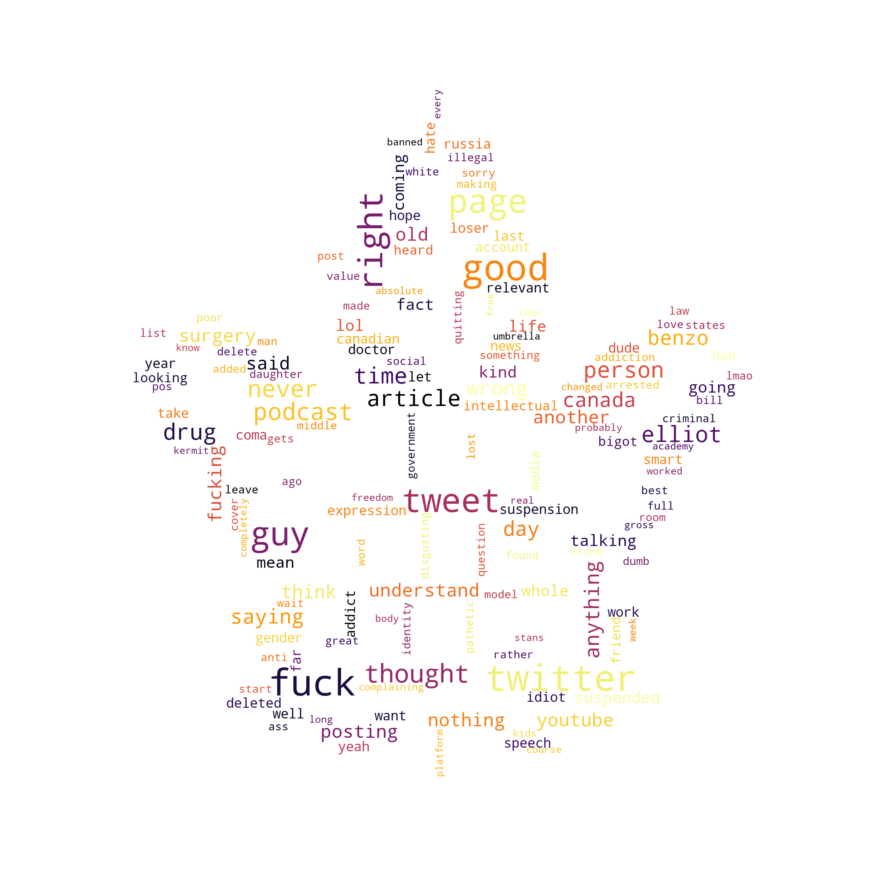

In [145]:
mask = np.array(Image.open("C:/Users/reigh/Desktop/Stupid pics/leafyyy.png"))

wordcloud = WordCloud(width=5000, 
                     height=3000, 
                     random_state=100, 
                     max_font_size=222,
                     mask=mask,
                     background_color='white',
                     max_words=150,
                     colormap='inferno').generate(all_can_lem)

plt.figure(figsize=(18, 16))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off');

In [146]:
ohcanada['comments'][10]

'peterson rose to fame in as a result of a series of youtube videos in which he criticized political correctness and bill c a law passed by the canadian government that added gender identity to the list of compelled speech and made it mandatory to refer to someone who uses certain language or it just added the phrase gender identity or expression to the lists of protected classes in existing anti hate and anti discrimination laws '

In [147]:
ohcanada['comments'][9]

'twitter is cleaning its room '

"How Jordan Peterson Canceled Himself"

In [148]:
#another post from `On Guard For Thee` subreddit


url = "https://www.reddit.com/r/onguardforthee/comments/vwm2a4/how_jordan_peterson_canceled_himself/"
submission = reddit.submission(url=url)

In [149]:
corpus = []

for top_level_comment in submission.comments[1:]:
    if isinstance(top_level_comment, MoreComments):
        continue
    corpus.append(top_level_comment.body)

#applying cleaning to the element before secondary cleaning within dataframe   
corpus = web_cleaner(corpus)

cancelled = pd.DataFrame(corpus, columns=["comments"])

In [150]:
#saving to .csv to keep/use for later without pulling

cancelled.to_csv("cancelled.csv", na_rep='NULL')

In [151]:
#Verifying the saved .csv

cancelled = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/cancelled.csv')
cancelled = cancelled.drop(columns=['Unnamed: 0'])
cancelled.tail(3)

,comments
59,looool i don t think so he has been true to hi...
60,deleted
61,deleted


In [152]:
cancelled['text_token']= cancelled['comments'].apply(regexp.tokenize)
cancelled.head(3)

,comments,text_token
0,he s been absolutely dedicated to cancelling h...,"[he, s, been, absolutely, dedicated, to, cance..."
1,jp has always been a pseudo intellectual hack ...,"[jp, has, always, been, a, pseudo, intellectua..."
2,meanwhile pierre poilievre is happy to sit dow...,"[meanwhile, pierre, poilievre, is, happy, to, ..."


In [153]:
stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one', 'even', 'ways',
               'the', 'were', 'where', 'have', 'they', 'thing', 'many', 'comment', 'might', 'could', 'keep', 'back',
               'sub', 'comments', 'subs', 'things', 'this', 'www', 'like', 'pdf', 'see', 'say', 'come',
               'some', 'new', 'really', 'has', 'people', 'would', 'seems', 'always', 'much', 'guy',
               'post', 'name', 'year', 'time', 'know', 'want', 'need', 'said', 'deleted', 'else',
               'needs', 'maybe', 'jordan', 'peterson', 'anyone', 'still']

stopwords.extend(my_stopwords)

cancelled['text_token'] = cancelled['text_token'].apply(lambda x: [item for item in x if item not in stopwords])

#removing two letter words
cancelled['text_string'] = cancelled['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
cancelled.head(3)

,comments,text_token,text_string
0,he s been absolutely dedicated to cancelling h...,"[absolutely, dedicated, cancelling, years, lmao]",absolutely dedicated cancelling years lmao
1,jp has always been a pseudo intellectual hack ...,"[jp, pseudo, intellectual, hack, last, years, ...",pseudo intellectual hack last years hitting pi...
2,meanwhile pierre poilievre is happy to sit dow...,"[meanwhile, pierre, poilievre, happy, sit, int...",meanwhile pierre poilievre happy sit interview...


In [154]:
oh_can1 = ' '.join([word for word in cancelled['text_string']])
tokenized_words15 = nltk.tokenize.word_tokenize(oh_can1)

In [155]:
can = FreqDist(tokenized_words15)
print(can.most_common(50))

[('man', 8), ('think', 8), ('right', 8), ('twitter', 7), ('get', 6), ('daily', 5), ('less', 5), ('never', 5), ('shit', 5), ('cancelled', 5), ('intellectual', 4), ('deep', 4), ('end', 4), ('sad', 4), ('wire', 4), ('anything', 4), ('com', 4), ('culture', 4), ('believe', 4), ('listened', 4), ('reddit', 4), ('years', 3), ('last', 3), ('old', 3), ('book', 3), ('first', 3), ('debate', 3), ('nothing', 3), ('becoming', 3), ('getting', 3), ('find', 3), ('funny', 3), ('benzo', 3), ('well', 3), ('dumb', 3), ('full', 3), ('content', 3), ('attention', 3), ('ass', 3), ('stupid', 3), ('fuck', 3), ('advice', 3), ('self', 3), ('help', 3), ('addiction', 3), ('ever', 3), ('everything', 3), ('someone', 3), ('media', 3), ('reading', 3)]


In [156]:
y = [count for tag, count in can.most_common(15)]
x = [tag for tag, count in can.most_common(15)]

fig = px.bar(cancelled, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="On Guard conversation about Twitter suspention",
    xaxis_title="Frequency",
    yaxis_title="Words",
    legend_title="")

fig.show()

In [157]:
cancelled['comments'][1]

'jp has always been a pseudo intellectual hack but these last few years of hitting the pills or whatever else he s been doing has driven him completely off the deep end now he s just a bitter hateful old man who seems most bothered by people who dont think exactly like he does it would be kinda sad if he didnt still have such a large following among incels and other men looking to blame everybody but themselves for their own problems '

In [158]:
cancelled['comments'][57]

'maybe i m giving peterson more credit then he deserves here but is it possible this whole thing was just a charade a way for him to lure dupes into the daily wire seems to feed right into there new media you can only trust what we say schtick i mean he can play victim and say he s been cancelled for free speech the only place you ll be able to hear his dangerous thoughts are on the daily wire etc seems like the sort of story those dupes would eat up in heartbeat i d like to believe peterson is just a bumbling benzo d idiot but maybe this is planned in a way '

In [159]:
cancelled['comments'][22]

'this angry sad little man '

## Men's Rights and OnGuardForThee Subreddit INTERPRETATION:
______________________________________________________________________________________________________

The words are surpring here considering Dr.Peterson's public conservatism and recent associations with both American and Canadian conservative politicians it is interesting to see these conservative nationalist communities in such dislike of him. It seems their focus is mostly on his personal life and media attention but surprising none the less as I assumed with the Christian-conservative connection they would be in favor of Peterson.
______________________________________________________________________________________________________

______________________________________________________________________________________________________
## Conservative subreddit answers teen JP fan:
______________________________________________________________________________________________________

In [160]:
#Comments concerning a student disallowed from quoting Ben Shapiro and Jordan Peterson in high school

url = "https://www.reddit.com/r/Conservative/comments/afrmjd/disqualified_in_a_high_school_debate_for_quoting/"
submission = reddit.submission(url=url)

In [161]:
corpus = []

for top_level_comment in submission.comments[1:]:
    if isinstance(top_level_comment, MoreComments):
        continue
    corpus.append(top_level_comment.body)

#applying cleaning to the element before secondary cleaning within dataframe   
corpus = web_cleaner(corpus)

debate = pd.DataFrame(corpus, columns=["comments"])

In [162]:
#saving to .csv to keep/use for later without pulling

debate.to_csv("debate.csv", na_rep='NULL')

In [163]:
#Verifying the saved .csv

debate = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/debate.csv')
debate = debate.drop(columns=['Unnamed: 0'])
debate.tail(3)

,comments
103,happy to see debate is still a thing disappoin...
104,it s kritik not critique thus the phrase runni...
105,any chance to take legal recourse


In [164]:
debate['text_token']= debate['comments'].apply(regexp.tokenize)

stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one', 'even', 'ways',
               'the', 'were', 'where', 'have', 'they', 'thing', 'many', 'comment', 'might', 'could', 'keep', 'back',
               'sub', 'comments', 'subs', 'things', 'this', 'www', 'like', 'pdf', 'see', 'say', 'come',
               'some', 'new', 'really', 'has', 'people', 'would', 'seems', 'always', 'much', 'guy',
               'post', 'name', 'year', 'time', 'know', 'want', 'need', 'said', 'deleted', 'else',
               'may', 'lol', 'yes', 'since', 'someone', 'possible', 'brought', 'actually', 'saying']

stopwords.extend(my_stopwords)

debate['text_token'] = debate['text_token'].apply(lambda x: [item for item in x if item not in stopwords])

#removing two letter words
debate['text_string'] = debate['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
debate.head(3)

,comments,text_token,text_string
0,i support the point you were trying to make an...,"[support, point, trying, make, think, absolute...",support point trying make think absolutely sha...
1,my partner and i were assigned the negative po...,"[partner, assigned, negative, position, oppone...",partner assigned negative position opponents r...
2,removed,[removed],removed


In [165]:
deb = ' '.join([word for word in debate['text_string']])
tokenized_words16 = nltk.tokenize.word_tokenize(deb)

deb_c = FreqDist(tokenized_words16)
print(deb_c.most_common(100))

[('debate', 53), ('white', 18), ('judge', 12), ('racist', 11), ('shapiro', 11), ('win', 9), ('slam', 9), ('skin', 9), ('left', 9), ('point', 8), ('identity', 8), ('shit', 8), ('something', 8), ('color', 8), ('fallacy', 8), ('better', 8), ('video', 8), ('make', 7), ('think', 7), ('good', 7), ('also', 7), ('argument', 7), ('get', 7), ('reddit', 7), ('arguments', 6), ('politics', 6), ('hope', 6), ('removed', 6), ('echo', 6), ('chamber', 6), ('based', 6), ('well', 6), ('team', 6), ('peterson', 6), ('poetry', 6), ('leftist', 6), ('judges', 6), ('points', 6), ('racism', 6), ('logic', 6), ('never', 6), ('position', 5), ('instead', 5), ('read', 5), ('going', 5), ('formal', 5), ('academia', 5), ('lost', 5), ('least', 5), ('makes', 5), ('ever', 5), ('words', 5), ('best', 5), ('still', 5), ('place', 5), ('ben', 5), ('absolutely', 4), ('try', 4), ('arguing', 4), ('whether', 4), ('privilege', 4), ('poem', 4), ('considered', 4), ('fighting', 4), ('fact', 4), ('listen', 4), ('problem', 4), ('caucasit

In [166]:
y = [count for tag, count in deb_c.most_common(15)]
x = [tag for tag, count in deb_c.most_common(15)]

fig = px.bar(debate, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Conservative subreddit-teen questions",
    xaxis_title="Frequency",
    yaxis_title="Words",
    legend_title="")

fig.show()

In [167]:
debate['comments'][0]

'i support the point you were trying to make and i think it was absolutely shameful that the affirmative resorted to ad hominem to try and win the debate but by god you guys gave that debate away you got suckered into arguing about whether you were qualified or not to give a position instead of actually arguing about a position rule of debate don t put yourself in check if you come across these kinds of arguments again don t try to prove your credibility by disproving white privilege instead i recommend focusing on actually dismantling their position there is credible evidence scholarly articles in peer reviewed journals supporting controlled immigration if they come into the debate firing a double barrel of identity politics and anti white sentiment fire back with content actually related to the topic statement you will win hands down i hope this helps '

In [168]:
debate['comments'][1]

'my partner and i were assigned the negative position but our opponents did not read a plan instead they performed a slam poem about citizenship and dehumanization i thought these type of debate strategies were chan trolls and shit but they re really considered legitimate lmao'

In [169]:
#wow.
debate['comments'][27]

'feels come first reasons to justify it come later even if you have to make up a word to do so one has to wonder if your caucasity prevented you from being able to speak on the subject how was this even fair to have you debate this topic in the first place surely a federally funded state university holding a competition where a contestant was virtually disqualified at the outset due to race should be legally actionable somehow '

In [170]:
#oof.
debate['comments'][103]

'happy to see debate is still a thing disappointed that the judges are biased however i guess its to be expected if its to be expected then maybe you can better argue against it sounds like you do a pretty great job though this brought me back about years imo the problem is debating people that are liberals they argue feelings you argue fact reminds me of something i heard from shapiro that suggested you use their tactics against them he suggests arguing the morality which you seem to be a good job of doing or find a better source id love to see someone try to argue a quote from mlk as racist while running identity politics shit self identify as an african american i think that would be hilarious and interesting every so often i would run something hilarious and off the wall people dont expect it and it gets some laughs people like laughing judges are people also can you still run counter plans topicality if you think aff has a bullshit plan or none at all id really be interested in he

## Quick INTERPRETATION:
______________________________________________________________________________________________________
The language used here fits closer with my hypothesis/original expectation's a little more from what I had been personally seeing online. The word "fallacy" is one that I'd initially noticed being used in high amounts with his followers in arguments online (though not included in my proposal). The word 'caucasity'(https://www.dictionary.com/e/slang/caucacity/) is used 4 times here, assumedly to refer by white people, to being subjigated about their whiteness. Though primarily used by the black community in response to 'white behaviors' here I think it may be used ironically by the community it was invented about/for. 
______________________________________________________________________________________________________

______________________________________________________________________________________________________
## Here is the Top rated JP related post of all time:
Recently created due to his online issues with fellow Canadian Actor Eliott Page
______________________________________________________________________________________________________

In [171]:
url = "https://www.reddit.com/r/news/comments/vomwfe/twitter_suspends_jordan_petersons_account_after/"
submission = reddit.submission(url=url)

In [172]:
corpus = []

for top_level_comment in submission.comments[1:]:
    if isinstance(top_level_comment, MoreComments):
        continue
    corpus.append(top_level_comment.body)

#applying cleaning to the element before secondary cleaning within dataframe   
corpus = web_cleaner(corpus)

eliott = pd.DataFrame(corpus, columns=["comments"])

In [173]:
eliott.to_csv("eliott.csv", na_rep='NULL')

In [174]:
#Verifying the saved .csv

eliott = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/eliott.csv')
eliott = eliott.drop(columns=['Unnamed: 0'])
eliott.tail(3)

,comments
21,deleted
22,the fact that i literally genuinely sincerely ...
23,saying remember when pride was a sin is about ...


In [175]:
eliott['text_token']= eliott['comments'].apply(regexp.tokenize)
eliott.head(3)

,comments,text_token
0,deleted,[deleted]
1,this part of the tweet is just as fucking ridi...,"[this, part, of, the, tweet, is, just, as, fuc..."
2,the best rebuttal for anyone that tries to quo...,"[the, best, rebuttal, for, anyone, that, tries..."


In [176]:
stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one', 'even', 'ways',
               'the', 'were', 'where', 'have', 'they', 'thing', 'many', 'comment', 'might', 'could', 'keep', 'back',
               'sub', 'comments', 'subs', 'things', 'this', 'www', 'like', 'pdf', 'see', 'say', 'come',
               'some', 'new', 'really', 'has', 'people', 'would', 'seems', 'always', 'much', 'guy',
               'post', 'name', 'year', 'time', 'know', 'want', 'need', 'said', 'deleted', 'delete',
                'get', 'got', 'deleted', 'removed', 'anyone', 'com']

stopwords.extend(my_stopwords)

eliott['text_token'] = eliott['text_token'].apply(lambda x: [item for item in x if item not in stopwords])

#removing two letter words
eliott['text_string'] = eliott['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
eliott.head(3)

,comments,text_token,text_string
0,deleted,[],
1,this part of the tweet is just as fucking ridi...,"[part, tweet, fucking, ridiculous, remember, p...",part tweet fucking ridiculous remember pride s...
2,the best rebuttal for anyone that tries to quo...,"[best, rebuttal, tries, quote, man, non, ironi...",best rebuttal tries quote man non ironically w...


In [177]:
all_elt = ' '.join([word for word in eliott['text_string']])
tokenized_words16 = nltk.tokenize.word_tokenize(all_elt)

In [178]:
el_f = FreqDist(tokenized_words16)
print(el_f.most_common(30))

[('fucking', 4), ('pride', 4), ('remember', 3), ('man', 3), ('coma', 3), ('jordan', 3), ('doctor', 3), ('procedure', 3), ('part', 2), ('tweet', 2), ('sin', 2), ('best', 2), ('mouth', 2), ('book', 2), ('twitter', 2), ('bible', 2), ('referring', 2), ('recalls', 2), ('waking', 2), ('confused', 2), ('tethered', 2), ('surrounded', 2), ('speaking', 2), ('foreign', 2), ('language', 2), ('canada', 2), ('peterson', 2), ('benzo', 2), ('addiction', 2), ('literally', 2)]


In [179]:
y = [count for tag, count in el_f.most_common(15)]
x = [tag for tag, count in el_f.most_common(15)]

fig = px.bar(eliott, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Top post for JP about Eliott Page",
    xaxis_title="Frequency",
    yaxis_title="Words",
    legend_title="Color-Word")

fig.show()

In [180]:
eliott['text_string_fdist'] = eliott['text_token'].apply(lambda x: ' '.join([item for item in x if el_f[item] >= 1 ]))

In [181]:
eliott['text_string_lem'] = eliott['text_string_fdist'].apply(wordnet_lem.lemmatize)

all_elt_lem = ' '.join([word for word in eliott['text_string_lem']])

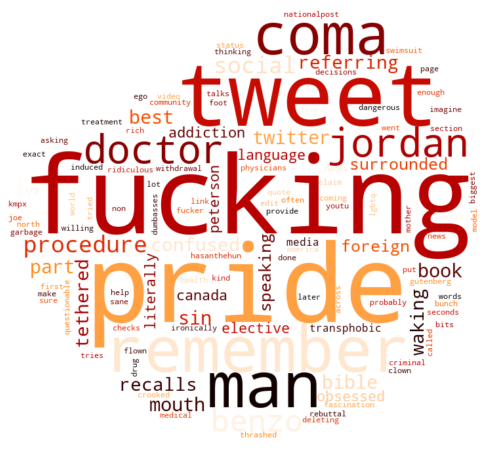

In [182]:
mask = np.array(Image.open("C:/Users/reigh/Desktop/Stupid pics/blob.png"))

wordcloud = WordCloud(width=5000, 
                     height=3000, 
                     random_state=10, 
                     max_font_size=222,
                     mask=mask,
                     background_color='white',
                     max_words=125,
                     colormap='gist_heat').generate(all_elt_lem)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off');

In [183]:
sentiment_score(all_elt_lem)

Overall sentiment of dictionary:  {'neg': 0.173, 'neu': 0.628, 'pos': 0.199, 'compound': 0.8516}
Sentiment seems:  17.299999999999997 % Negative
Sentiment seems:  62.8 % Neutral
Sentiment seems:  19.900000000000002 % Positive
Sentiment rating overall Neutral


______________________________________________________________________________________________________
## Last but not least, JP's supposed Reddit Q&A
______________________________________________________________________________________________________

In [184]:
#Supposedly his own question/response within reddit

url = "https://www.reddit.com/r/IAmA/comments/615e3z/i_am_dr_jordan_b_peterson_u_of_t_professor/"
submission = reddit.submission(url=url)

In [185]:
corpus = []

for top_level_comment in submission.comments[1:]:
    if isinstance(top_level_comment, MoreComments):
        continue
    corpus.append(top_level_comment.body)

#applying cleaning to the element before secondary cleaning within dataframe   
corpus = web_cleaner(corpus)

jcp_reddit = pd.DataFrame(corpus, columns=["comments"])

In [186]:
jcp_reddit.to_csv("jcp_reddit.csv", na_rep='NULL')


In [187]:
jcp_reddit = pd.read_csv(r'C:/Users/reigh/Desktop/jor_project/jcp_reddit.csv')
jcp_reddit = jcp_reddit.drop(columns=['Unnamed: 0'])
jcp_reddit.tail(3)

,comments
97,dr peterson you are very critical of marxism y...
98,how do you define sorting oneself out
99,i have a recurring dream about picking up gold...


In [188]:
jcp_reddit['comments'][97]

'dr peterson you are very critical of marxism yet you have a portrait of lenin addressing a crowd in your home what is the meaning of that image to you '

In [189]:
jcp_reddit['comments'][20]

'how can i learn to raise my children properly or wisely what books or lectures are useful '

In [190]:
jcp_reddit['comments'][40]

'thanks so much for taking the time to do this it is a real joy for many here i i recently had the either revelation or strong illusion that my personal character was in such disarray it was truly beyond repair i simply have too many deeply seeded and complicated bad habits ill call them and they have affected my surroundings in so many ways that i couldnt even hope to ever identify them all let alone fix them what are we to do when we find ourselves in this situation practically speaking can you comment on the inversion of the judeo christian myth espoused by satanists and various esoteric groups where god is depicted as an evil tyrant demiurge and satan the great emancipator who gave us free will via the tree of knowledge when someone accepts christ into their heart in conjunction with the beleif that jesus was a historical figure who was also god rose from the dead and has personal relationship with them what is really taking place how can we best protect our future chldren from pos

In [191]:
jcp_reddit['comments'][58]

'dr peterson i ve listened to at least one lecture or interview of yours every day since you appeared on the rubin report thank you so much for taking the atheists to task for not actually being darwinian enough two questions one long one short and sweet i m a left liberal but i m exhausted by their anti biology anti liberty and victim worship ways and they are sick of me calling them on it however on the other side amongst some of your followers i find people telling me that africa is suffering because of the the low iqs of africans who assert that women high in industriousness and intelligence are genetic mutants repulsive to men and that men and women with traits atypical for their gender are mentally ill i hope you agree that these are all distortions of your findings i admire you because you seem to stand at an intersection many intersections such as science and religion what is your advice for someone who is caught between two polarities political or otherwise and feels alienated

In [192]:
jcp_reddit['comments'][60]

'i have derealisation had it for years i find it very hard to slay my dragons when i have no connection to the world or judging that i m actually in any moment within my life seen therapists doctors etc no change any advice p s i would love to see you talk about the subject of derealisation dissociation from the world life in any context '

In [193]:
jcp_reddit['text_token']= jcp_reddit['comments'].apply(regexp.tokenize)
jcp_reddit.head(5)


stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means', 'one', 'even', 'ways',
               'the', 'were', 'where', 'have', 'they', 'thing', 'many', 'comment', 'might', 'could', 'keep', 'back',
               'sub', 'comments', 'subs', 'things', 'this', 'www', 'like', 'pdf', 'see', 'say', 'come',
               'some', 'new', 'really', 'has', 'people', 'would', 'seems', 'always', 'much', 'guy',
               'post', 'name', 'year', 'time', 'know', 'want', 'need', 'said', 'deleted', 'delete',
               'get', 'got', 'deleted', 'removed', 'ever', 'also', 'peterson', 'make', 'put',
               'etc', 'give','ama', 'mentioned','within', 'comes','made', 'sort', 'however',
               'part','rather', 'aspects','hello']

stopwords.extend(my_stopwords)

jcp_reddit['text_token'] = jcp_reddit['text_token'].apply(lambda x: [item for item in x if item not in stopwords])

#removing two letter words
jcp_reddit['text_string'] = jcp_reddit['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
jcp_reddit.head(3)

,comments,text_token,text_string
0,what do you think of all of the memes about you,"[think, memes]",think memes
1,which questions are keeping you up at night ho...,"[questions, keeping, night, assist, finding, a...",questions keeping night assist finding answers
2,professor you have talked in your lectures abo...,"[professor, talked, lectures, wasting, operati...",professor talked lectures wasting operating cl...


In [194]:
jor_red = ' '.join([word for word in jcp_reddit['text_string']])
tokenized_words17 = nltk.tokenize.word_tokenize(jor_red)

red_jor = FreqDist(tokenized_words17)
print(red_jor.most_common(150))

[('think', 24), ('life', 17), ('thank', 15), ('lectures', 14), ('question', 13), ('truth', 12), ('believe', 12), ('find', 11), ('religion', 11), ('thoughts', 10), ('advice', 9), ('work', 9), ('never', 8), ('social', 8), ('best', 8), ('experience', 8), ('human', 8), ('questions', 7), ('day', 7), ('thanks', 7), ('meaning', 7), ('often', 7), ('feel', 7), ('actually', 7), ('video', 7), ('going', 7), ('games', 7), ('good', 6), ('someone', 6), ('point', 6), ('world', 6), ('order', 6), ('possible', 6), ('two', 6), ('jesus', 6), ('topics', 6), ('recent', 6), ('talk', 6), ('night', 5), ('read', 5), ('music', 5), ('love', 5), ('important', 5), ('long', 5), ('war', 5), ('person', 5), ('self', 5), ('opinion', 5), ('moral', 5), ('something', 5), ('attention', 5), ('makes', 5), ('old', 5), ('personality', 5), ('canada', 5), ('totalitarianism', 5), ('left', 5), ('quote', 5), ('gender', 5), ('law', 5), ('society', 5), ('getting', 4), ('depression', 4), ('low', 4), ('conscientiousness', 4), ('favourite

In [195]:
y = [count for tag, count in red_jor.most_common(15)]
x = [tag for tag, count in red_jor.most_common(15)]

fig = px.bar(jcp_reddit, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="TTop 15 words for Reddit Q&A",
    xaxis_title="Frequency",
    yaxis_title="Words",
    legend_title="Color-Word")

fig.show()

______________________________________________________________________________________________________
## Bonus...perhaps the infamous 'letter' we've seen mentioned
______________________________________________________________________________________________________

In [196]:
raw_html = urllib.request.urlopen('https://nationalpost.com/opinion/jordan-peterson-why-i-am-no-longer-a-tenured-professor-at-the-university-of-toronto')  
raw_html = raw_html.read()

article_html = BeautifulSoup(raw_html, 'lxml')

#turning the element into a corpus
df1 = corpus_maker(article_html)
#cleaning said corpus
df1 = web_cleaner(df1)
#turning into a dataframe
letter = pd.DataFrame(df1)

In [197]:
letter = letter.drop(letter.index[0:6])
letter = letter.drop(letter.index[144:160])

In [198]:
regexp = RegexpTokenizer('\w+')

letter['text_token']= letter[0].apply(regexp.tokenize)
letter.head(3)

,0,text_token
6,emeritus is generally a designation reserved f...,"[emeritus, is, generally, a, designation, rese..."
7,i had envisioned teaching and researching at t...,"[i, had, envisioned, teaching, and, researchin..."
8,i loved my job,"[i, loved, my, job]"


In [199]:
stopwords = nltk.corpus.stopwords.words("english")

my_stopwords = ['https', 'way', 'have', 'they', 'will', 'for', 'can', 'are', 'means',
                'one', 'even', 'ways', 'national', 'post', 'many', 'might', 'could', 'four',
                'else', 'would', 'almost', 'without', 'perhaps', 'trying', 'next', 
                'faq', 'users', 'subscriptions', 'account', 'posted', 'jordan', 'peterson',
                'email', 'many', 'comments', 'crossword', 'save', 'soon', 'follow', 'yet',
                'content', 'advertisement', 'article', 'continues', 'longer', 'new', 'need',
                'called', 'see', 'along', 'everything', 'also', 'try', 'back', 'point', 'already',
                'get', 'every', 'far', 'recent','going', 'comment','done','want', 'time','load',
                'well', 'anything', 'newsletter', 'inbox', 'clicking','said', 'partly', 'much',
                'really', 'come', 'signing', 'unsubscribe', 'link', 'inc', 'may', 'less', 'second',
                'least', 'simply','ever', 'address','sign', 'meet','head']

stopwords.extend(my_stopwords)

letter['text_token'] = letter['text_token'].apply(lambda x: [item for item in x if item not in stopwords])

#removing two letter words
letter['text_string'] = letter['text_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
letter.head(3)

,0,text_token,text_string
6,emeritus is generally a designation reserved f...,"[emeritus, generally, designation, reserved, s...",emeritus generally designation reserved supera...
7,i had envisioned teaching and researching at t...,"[envisioned, teaching, researching, u, full, h...",envisioned teaching researching full haul skel...
8,i loved my job,"[loved, job]",loved job


In [200]:
all_let = ' '.join([word for word in letter['text_string']])
tokenized_words27 = nltk.tokenize.word_tokenize(all_let)

let = FreqDist(tokenized_words27)
print(let.most_common(150))

[('story', 14), ('loaded', 13), ('die', 13), ('social', 8), ('students', 7), ('enough', 7), ('people', 6), ('universities', 6), ('left', 6), ('university', 5), ('diversity', 5), ('training', 5), ('world', 5), ('ago', 5), ('graduate', 4), ('research', 4), ('good', 4), ('professor', 4), ('please', 4), ('ideology', 4), ('bipoc', 4), ('enterprise', 4), ('manner', 4), ('psychology', 4), ('canada', 4), ('professional', 4), ('times', 4), ('writers', 4), ('stop', 4), ('job', 3), ('reasons', 3), ('qualified', 3), ('hiring', 3), ('minority', 3), ('toronto', 3), ('platformed', 3), ('network', 3), ('reason', 3), ('culture', 3), ('woke', 3), ('committee', 3), ('decades', 3), ('combined', 3), ('bias', 3), ('human', 3), ('implicit', 3), ('meritorious', 3), ('clinical', 3), ('programs', 3), ('think', 3), ('absolutely', 3), ('hollywood', 3), ('liberal', 3), ('best', 3), ('radical', 3), ('literally', 3), ('gender', 3), ('professors', 3), ('shopping', 3), ('essentials', 3), ('days', 3), ('fashion', 3), (

In [202]:
y = [count for tag, count in let.most_common(15)]
x = [tag for tag, count in let.most_common(15)]

fig = px.bar(letter, y=x, x=y, 
            text_auto='.2s', 
            color=x)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.update_layout(
    title="Top Words for 'The Letter'",
    xaxis_title="Frequency",
    yaxis_title="Words",
    legend_title="Color-Word")

fig.show()

In [203]:
letter['text_string_fdist'] = letter['text_token'].apply(lambda x: ' '.join([item for item in x if let[item] >= 1 ]))

wordnet_lem = WordNetLemmatizer()

letter['text_string_lem'] = letter['text_string_fdist'].apply(wordnet_lem.lemmatize)

all_let_lem = ' '.join([word for word in letter['text_string_lem']])

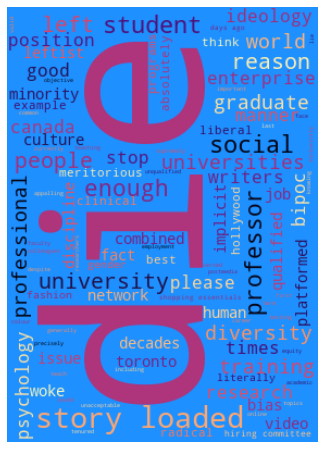

In [204]:
mask = np.array(Image.open("C:/Users/reigh/Desktop/Stupid pics/cn.png"))

wordcloud = WordCloud(width=5000, 
                     height=3000, 
                     random_state=10, 
                     max_font_size=200,
                     mask=mask,
                     background_color='dodgerblue',
                     max_words=100,
                     colormap='magma').generate(all_let_lem)

plt.figure(figsize=(16, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off');

In [205]:
sentiment_score(all_let_lem)

Overall sentiment of dictionary:  {'neg': 0.169, 'neu': 0.661, 'pos': 0.171, 'compound': -0.8378}
Sentiment seems:  16.900000000000002 % Negative
Sentiment seems:  66.10000000000001 % Neutral
Sentiment seems:  17.1 % Positive
Sentiment rating overall Neutral


In [206]:
letter['sentiment'] = letter['text_string_lem'].apply(lambda x: TextBlob(x).sentiment.polarity)
letter.head(2)

,0,text_token,text_string,text_string_fdist,text_string_lem,sentiment
6,emeritus is generally a designation reserved f...,"[emeritus, generally, designation, reserved, s...",emeritus generally designation reserved supera...,emeritus generally designation reserved supera...,emeritus generally designation reserved supera...,0.05
7,i had envisioned teaching and researching at t...,"[envisioned, teaching, researching, u, full, h...",envisioned teaching researching full haul skel...,envisioned teaching researching full haul skel...,envisioned teaching researching full haul skel...,0.35


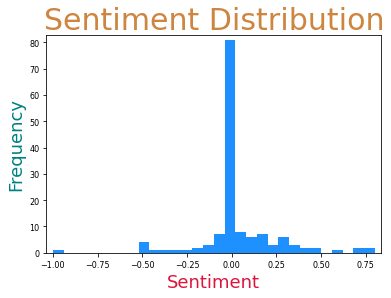

In [207]:
plt.figure(figsize=(6,4))
plt.margins(0.02)
plt.xlabel('Sentiment', fontsize=18, color='crimson')
plt.xticks(fontsize=8)
plt.ylabel('Frequency', fontsize=18, color='teal')
plt.yticks(fontsize=8)
plt.hist(letter['sentiment'], bins=30, color='dodgerblue')
plt.title('Sentiment Distribution', fontsize=30, color='peru')
plt.show()

In [208]:
letter.to_csv("letter.csv", na_rep='NULL')

## National Post Letter #2 (bonus) INTERPRETATION:
______________________________________________________________________________________________________
This is much closer to the language expected in the hypothesis. Here we have the word "die" 13 times, as well as "woke", "bipoc", and "hollywood" 3 times, "left/leftist" 8 times, "political agenda" 2 times, as well as "radical" and "liberals". This was in addressment to his retirement from the University of Toronto faculty. Though only a single article this is much closer to the language expected in the hypothesis and much closer I believe to his public videos.

The word "letter" was brought up quite a bit in all reddit conversations leading me to find what it was they were talking about. I believe this may be the particular "letter" that they are reffering to as it is the most recent.
______________________________________________________________________________________________________

______________________________________________________________________________________________________
## In Conclusion: 

With part two the Reddit data has proven more helpful in ways of sentiment. His fanbase is definetly a bit more extreme in their language than Jordan himself, which is to be understood as these are anonymous online users. However, without fail "God" appeared to be one of the top words in all Jordan Peterson focused forums with the final combined data frame containing "god" 547 times. Considering the somewhat small dataset, that takes up quite a large portion.

The amount of individual personal confessions on his pages are staggering, and often related to religion or ailing mental health. Many posts had the similar theme of feeling empty and disenfranchised in society and upon hearing/reading Dr.Peterson's work, have now converted to Christianity. Often Catholicism. In other cases I found young international kids of other Abhramaic religions praising him for his religious leanings and adhearance to "tradition". Though it seems to be prodominently male I don't think it's fair to say entirely, but it would be difficult to assess given the data however I saw several comments supposedly from self proclaimed women, and considering the forum assumedly female assigned at birth. 
   
   
   There is a sense of hopelessness and fear from his fanbase, which again is somewhat surprising to me. I expected (based on my bias') that most of his fanbase would be quite angry or self-righteous, and easily pinned down though once again there is more neutrality and open distress than expected. This is not to say that there is not some blatant right-wing rhetoric and bizarre racial theories but it is not the majority, it is not as obvious as the incredible amount of religion and Christianity that actually occurs in the data. 
   
   Not only is his fanbase interested in Christianity, they may not have been before introduction to Dr.Jordan Peterson. He is more than a public figure to them, he is akin to their father of spirtuality. As if to live life with the idea of 'What would Jordan Peterson Do?'. There's a messianic quality to how he's spoken of by his fans and a pushback to the non-traditional roles (to biblical standard) being currently supported by western society. There's a sense that this community feels lost in this new world, and are becoming more confused about how to understand everything and themselves within it so they are turning to Dr.Peterson for answers to their feelings. Feelings being the optimum word here, as they are turning to him as a Doctor of Psychology. 
   
   While researching in every article, comment, interview he is always introduced as "Clinical Psychologist Dr.Jordan Peterson", this is massively important to his success. His fans see him as a psychologist first, so when their preferred psychologist recommends "God" and Christian archetypes to organize one's "individual self" they may take that as doctors orders. Due to his medical license he is considered to be scientifically leaning in everything he says, as if his words are going to be backed by research and peer reviews, but mostly he references his personal research and Christian ideas and people.  
   
   After assessing the `r/JordanPeterson` subreddit I wanted to see how he's viewed in more 'extreme' circles. As reddit was my data source I can only pull things that are open, so certain extremist groups that may enjoy his work are not sourcible from this platform, though I was again surprised at the overall opinions and differences in perspecive outside of his own community. Starting with the "Men's Rights" subreddit it turns out that the men's rights community does not really support him. They seem to have similar view points to 'left-wing' sentiments about him and in general seem to want to dissassociate with him as much as possible as for their agenda he may messy things or create complication with his infamy and personal problems. The same can be seen for his "top post" about his comments on Elliot Page, it was very clear that within this forum Dr.Peterson was not being supported as he would in his own forums as once again his personal issues like "addiction" were brought in to discredit him. 
   
   The Conservative subreddit was much kinder to him though there weren't many posts about him comparatively so I chose what had the most comments to try to attain of sense of the crowd. Though it proved to be somewhat neutral as the community was addressing a high schooler, there was still quite a bit of right-wing rhetoric and race related undertones.
   
   In general the sentiment and impression towards how this fanbase views women would often get lumped in while clustering with words like "nature", "chaos", "mary", and "mother". With the exception of the Men's Rights forum which mentioned "rape" an alarming amount of times, but is to be expected from that community. Within the comments there was a common theme of women not being able to hold themselves in debate, being overly reactive and emotional, but the amount of discussion towards women was surprisingly small all things considering. Gender however is a pretty large topic as has been one of his draws with bill c-16 and more recently the Elliot Page pronoun refusal scandal. I genuinely based on previous bias, expected anti-feminist idealogy to be a large bulk of what to expect, but once again appears only a fraction within the collected data.
   
   As seen though, it is not truly possible using only this forum to entirely quantify his fanbase, though I think it is fair to say from this data that if they are positively associating his work there is a high probability that it is Christian/religiously related.
   
   
## `Final IMPRESSIONS`:

Though I expected some religious undertones in the hypothesis I didn't expect it to be the bulk of consistency and I also didn't realize what he actually meant to 'young disenfranchised males'. I'd assumed his more radical videos and right-wing adjeacent language was the main draw towards him for the young prodominently white male demographic of fans, but it turns out he seems to pull in disenfranchised MEN (seemingly of all ages and backgrounds) with spirituality and religion and societal traditionalism. It's not quite as easy as to say he's a populist or right-wing pundit, though there are public associations and some similar language observed in his fanbase.
   As a public medical professional, the amount of Christianity is unexpected. I am not trying in any way to insinuate that Christianity cannot align with modern science, or that a scientist cannot be religious or Christian, however you would think in a North American academic context that would not be the forefront of your work and speech unless he were aligning with a particular type of religious practice or within a religious department.

According to `catholiceducation.org`(https://www.catholiceducation.org/en/culture/catholic-contributions/the-roman-catholic-psychiatrist.html):

    "THE CATHOLIC PSYCHIATRIST AS EVANGELIZER
    The Roman Catholic Church has sounded the clarion call to duty: Conserve Truth; preserve the family. She has singled out the laity as a major player in rebuilding the Mystical Body of Christ and uplifting society from its moral turpitude. The lay person, in the midst of the world, has a unique vocation, whatever the state of life or whatever the expertise. We are to proclaim and put into practice the Gospel of Christ in the classrooms and tribunals of justice, in the family abode, in the marketplace and in clinics and hospitals. Psychiatrists, too, are not to separate the Catholic Faith from daily life but to unify our natural existence with the supernatural vision, in ourselves and in the patients we treat.

    Evangelization for the Catholic psychiatrist implies assent to the authoritative and irrefutable definition of man, a being at once corporeal and spiritual (CCC, no. 362), equipped with intelligence and a free will, with the capacity to ponder and to choose. This authentic model of the human person is the logical and sane replacement for the rampant deterministic, absurd and purposeless psychological and psychiatric theories..."




   Being that Dr.Peterson works within psychology I think he's been able to use Christianity as an aligory to modern problems without too much scrutiny but when that is the majority of what you align I feel there could be a significant bias at play. At a time when we have such advancements in the field for someone who is a Cognitive Psychologist he(when speaking scientifically) tends to site outdated psychologists or philosophers and theologians. With fMRI's so widely available, surely he'd be able to reference more modern research, even in his favor(ex.https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4086365/). With his intitial research being related to genetic alcoholism there have also been incredible medical strides in the field of addictions through modern science and methodologies. Though none of the newer methods would obfuscate religion, these current recommended practices are seldom if ever mentioned. 
   
   
## In the future...
  
  After working with this data my impression of Dr.Peterson would be that he is greatly interested in the individual spirit and it's purpose in the world/current society through a Christian lens and these sentiments are rubbing off on his fanbase based on the common lexicon and also blatant comments. I would intellectually liken him more towards theology or philosophy than psychology based on the data  collected. Though truly in order to properly understand him and his influence would be through his video contributions, debates and interviews. This would be incredibly helpful towards the project as a whole and some work in that direction has already started online(https://pub.towardsai.net/jordan-peterson-nlp-word-frequency-analysis-b18642205311).  
   
   The future for Jordan Peterson is interesting, recently as he is somewhat positively recieved by conservatives here in Canada, his political videos and articles like the National Post article features have pushed him into the modern political sphere. 
   Domestically noteable being his thoughts on the trucker occupation of Ottawa and elsewhere(https://www.louderwithcrowder.com/jordan-peterson-freedom-convoy) here referenced by Fox news darling Stephen Crowder. This has lead to more serious invitations for Peterson recently speaking to the house of Republicans(https://thehill.com/homenews/house/3557988-jordan-peterson-speaks-to-house-republicans-on-positive-messaging/) where he was recieved as "phenomenal". 
   
   What would the mostly right-wing Republican caucas want with a Canadian psychologist? The Republican party has been known to be staunchly anti-science(https://physicstoday.scitation.org/do/10.1063/PT.5.8014/full/) often citing creationism rather than evolution as an example. The thread most in common with Peterson and the Republicans is their conservative traditionalist Christian viewpoint. Though in comparison to many American Republicans he is very liberal, the beginning associations having been so connected to our own alt-right communities here in Canada are concerning(https://www.msn.com/en-ca/news/world/how-white-christian-nationalism-is-part-of-the-freedom-convoy-protests/ar-AATXkGg)/(https://www.msnbc.com/opinion/msnbc-opinion/why-republicans-christian-nationalism-so-dangerous-n1297527). Only time will tell for Dr.Peterson but I do not forsee his popularity to decrease anytime soon as he seems frequently in modern news cycles. Based on this data I expect to see more of his fanbase potentially converting to a "traditional" religion, most likely Christianity if the social climate continues. 
______________________________________________________________________________________________________


I appreciate the allowance the deep dive into this subject that has confounded me for many years, it was a great learning process and I will continue to expand upon the methods used here in the future. I feel as if I have somewhat of an answer to a longstanding question so thank you for that invaluable opportunity of time usage. 